In [1]:
%run './model/multi_corpus.py'
%run './constants.py'

In [14]:
corpora = co_occurence_graphs(n_edges=100)
Gs = {field_name: corpus['G'] for (field_name, corpus) in corpora.items()}
Dfs = {field_name: corpus['Df'] for (field_name, corpus) in corpora.items()}

Gender Studies Graph with 57 nodes and 100 edges
Geometry Graph with 61 nodes and 100 edges
Geophysics Graph with 63 nodes and 100 edges
Economics Graph with 50 nodes and 100 edges
Language & Linguistics Graph with 58 nodes and 100 edges
Probability & Statistics Graph with 58 nodes and 100 edges
Material Engineering Graph with 49 nodes and 100 edges
Artificial Intelligence Graph with 49 nodes and 100 edges
Sociology Graph with 76 nodes and 100 edges
International Business Graph with 51 nodes and 100 edges
Political Science Graph with 56 nodes and 100 edges
Genetics & Genomics Graph with 71 nodes and 100 edges
Immunology Graph with 92 nodes and 100 edges
Human Resources & Organizations Graph with 66 nodes and 100 edges
Ethnic & Cultural Studies Graph with 52 nodes and 100 edges
Neurology Graph with 46 nodes and 100 edges


Gender Studies 5


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/netgraph/_edge_layout.py:978: RuntimeWarning: invalid value encountered in divide
  displacement = compatibility * delta / distance_squared[..., None]
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/netgraph/_utils.py:360: RuntimeWarning: invalid value encountered in divide
  v = v / np.linalg.norm(v, axis=-1)[:, None] # unit vector


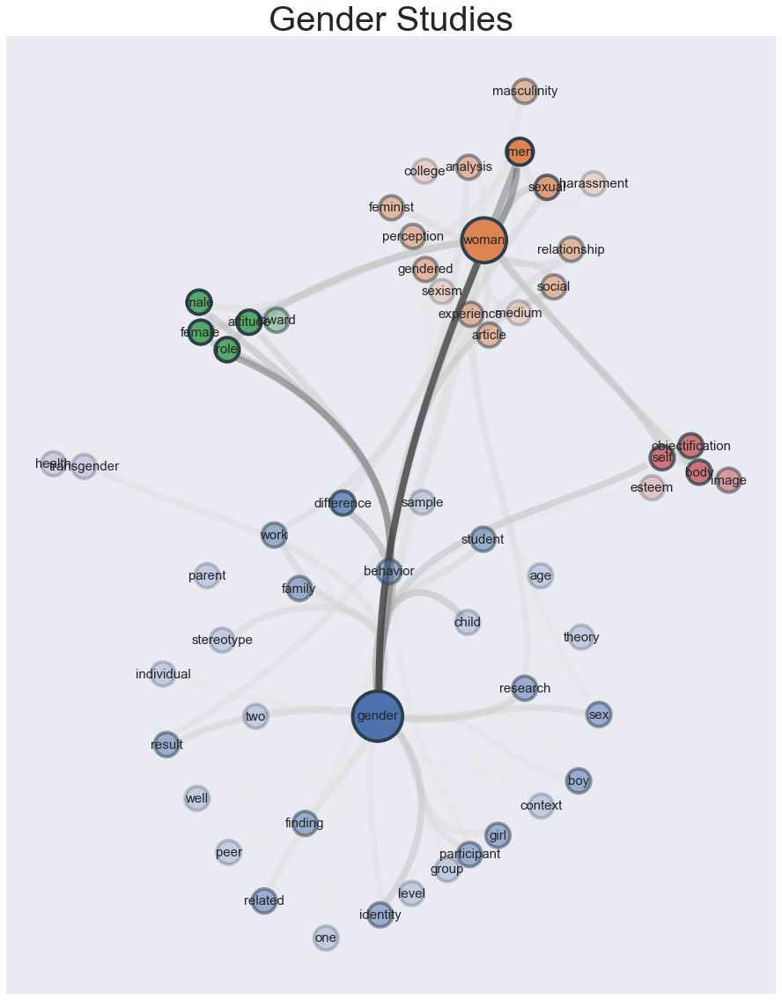

Geophysics 8


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/netgraph/_node_layout.py:1549: UserWarning: Graph contains a single community. Unable to compute a community layout. Computing spring layout instead.
  warnings.warn("Graph contains a single community. Unable to compute a community layout. Computing spring layout instead.")


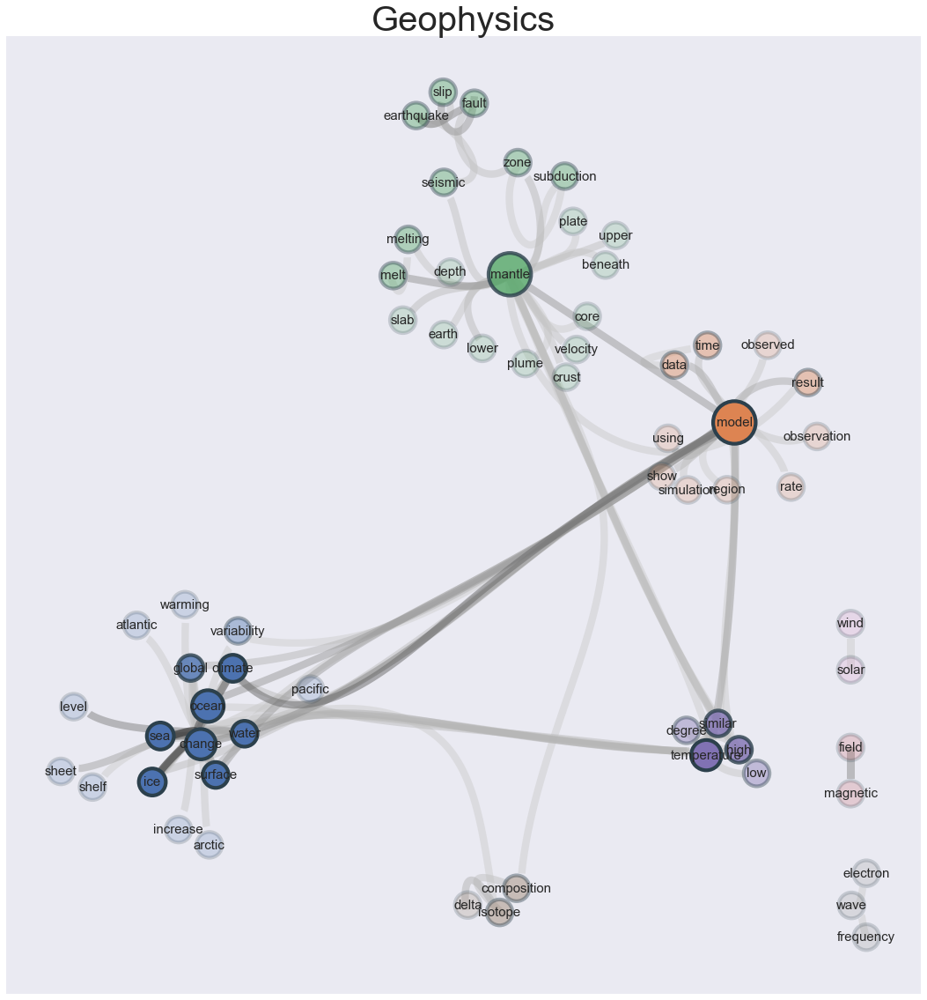

Probability & Statistics 6


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/netgraph/_node_layout.py:1023: RuntimeWarning: invalid value encountered in divide
  directions = deltas / magnitudes[:, np.newaxis]


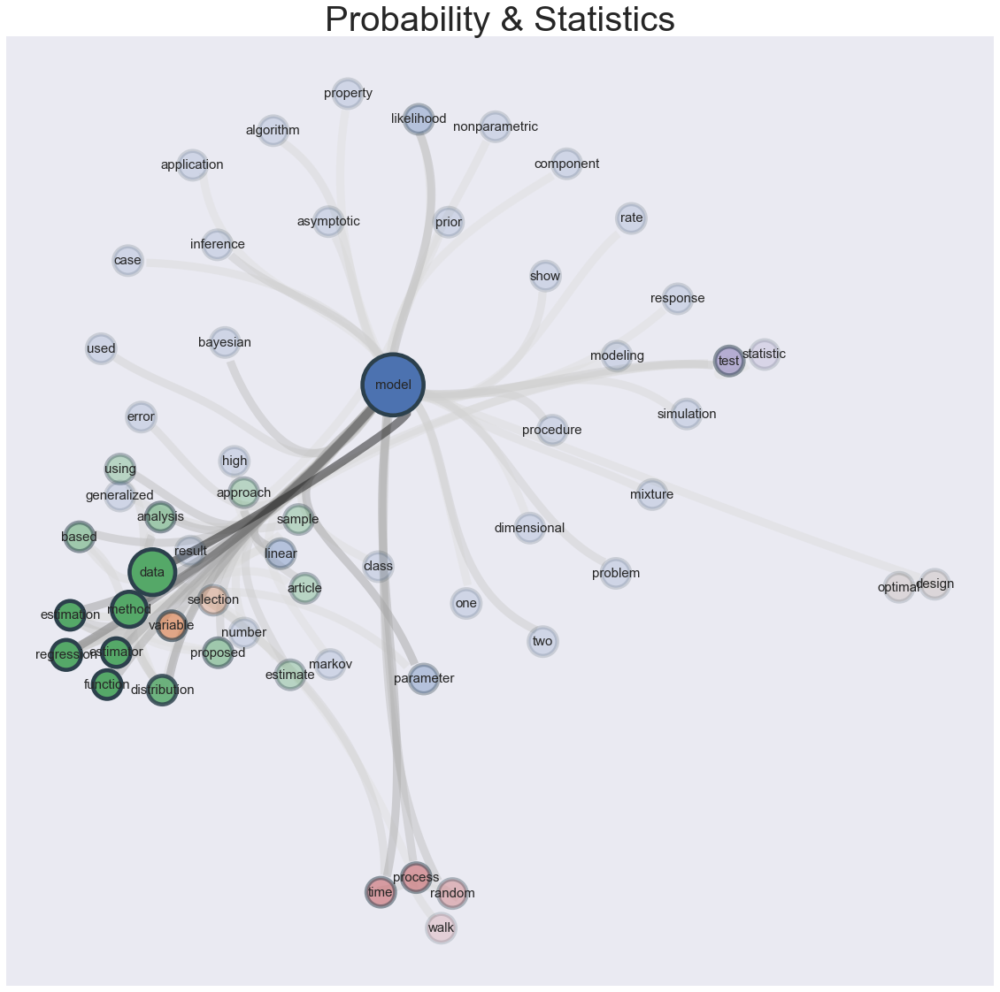

Sociology 10


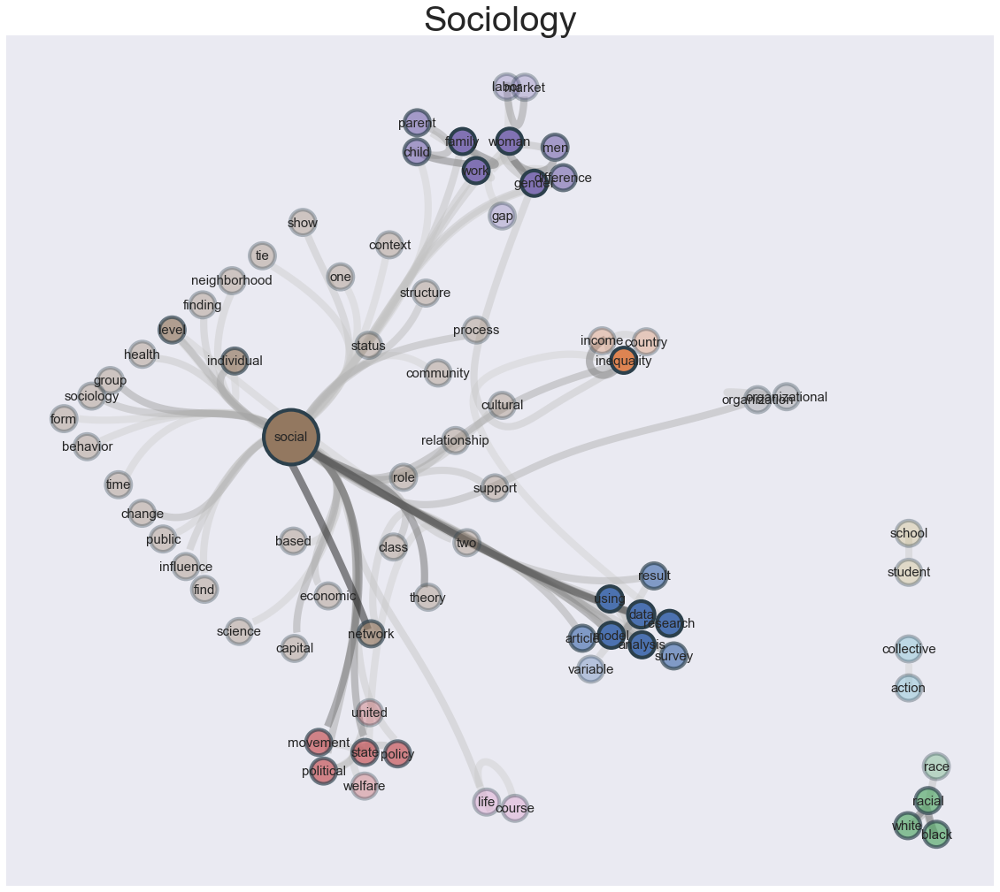

Political Science 5


In [26]:
from netgraph import Graph, ArcDiagram
from itertools import accumulate
import operator
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

import seaborn as sns

field_comm_num = {}
for field_name, G in Gs.items():

    if field_name not in ['Ethnic & Cultural Studies', 'Probability & Statistics', 'Sociology', 'Political Science', 'Ethnic & Cultural Studies']:
        continue

    communities = nx_comm.louvain_communities(G)
    communities = {node: i for i, comm in enumerate(communities) for node in comm}

    num_comm = len(set(communities.values()))
    print(field_name, num_comm)
    field_comm_num[field_name] = num_comm

    node_size = dict(nx.degree(G))
    node_size = {node: max(2, np.log(size)) for node, size in node_size.items()}

    comm_color = sns.color_palette()
    node_color = {node: comm_color[i] for node, i in communities.items()}

    node_alpha = nx.core_number(G)
    max_core = max(node_alpha.values())
    node_alpha = {n: core / max_core for n, core in node_alpha.items()}

    node_labels = dict(zip(G.nodes, G.nodes))

    fig, ax = plt.subplots(figsize=(20, 20))

    Graph(
        G,
        edge_layout='bundled',
        node_layout='community',
        node_size=node_size,
        node_color=node_color,
        node_labels=True,
        node_label_fontdict={'size': 15},
        node_label_offset=0.00,
        node_alpha=node_alpha,
        ax=ax,
        node_layout_kwargs=dict(node_to_community=communities)
    )

    plt.title(field_name, fontsize=40)
    
    plt.savefig(
        os.path.join('./latex/figures/co_occurrence_graphs_bundled', f'{field_name.capitalize()}.png'), 
        transparent=True, 
        dpi=150 
    )

    plt.show()

In [ ]:
corpora = co_citation_graphs()
Gs_cc = {field_name: corpus['G'] for (field_name, corpus) in corpora.items()}
Dfs_cc = {field_name: corpus['Df'] for (field_name, corpus) in corpora.items()}

In [9]:
df = Dfs_cc[field_name]

df_comm = pl.DataFrame({
    'Text': list(communities.keys()),
    'Comm': list(communities.values()),
})

df = (
    df
    .select('Doi', 'Date', 'Text')
    .explode('Text')
    .filter(pl.col('Text').is_in(list(G.nodes)))
    .groupby('Doi')
    .agg('Text', pl.col('Date').take(0))
    .with_columns(pl.col('Text').apply(lambda arr: list(combinations(arr, 2))))
    .explode('Text')
    .explode('Text')
    .join(df_comm, on='Text')
    .groupby(pl.col('Date').dt.year())
    .agg('Comm')
    .sort('Date')
)

d_comms = defaultdict(dict)
for date, comms in df.to_numpy():
    counter = Counter(comms)
    for k, v in counter.items():
        d_comms[k][date] = v

# ax1 = fig.add_axes([0.6, 0.6, 0.25, 0.25]) # , anchor='NE', zorder=1
ax1 = inset_axes(ax, width=2., height=2., bbox_transform=ax.transAxes) # , loc='upper right'
for comms, d in d_comms.items():
    ax1.plot(d.keys(), list(accumulate(d.values(), operator.add)), label=comms, linewidth=2, color=comm_color[comms])

ax1.set_xticks([])
ax1.set_yticks([])

plt.show()

/var/folders/rz/n4jmlyh1355cy_wkn5gd00x40000gn/T/ipykernel_51313/3510444669.py:31: UserWarning: Using the axes or figure transform requires a bounding box in the respective coordinates. Using bbox_to_anchor=(0, 0, 1, 1) now.
  ax1 = inset_axes(ax, width=2., height=2., bbox_transform=ax.transAxes) # , loc='upper right'


# Co-Occurence Graph

Gender Studies


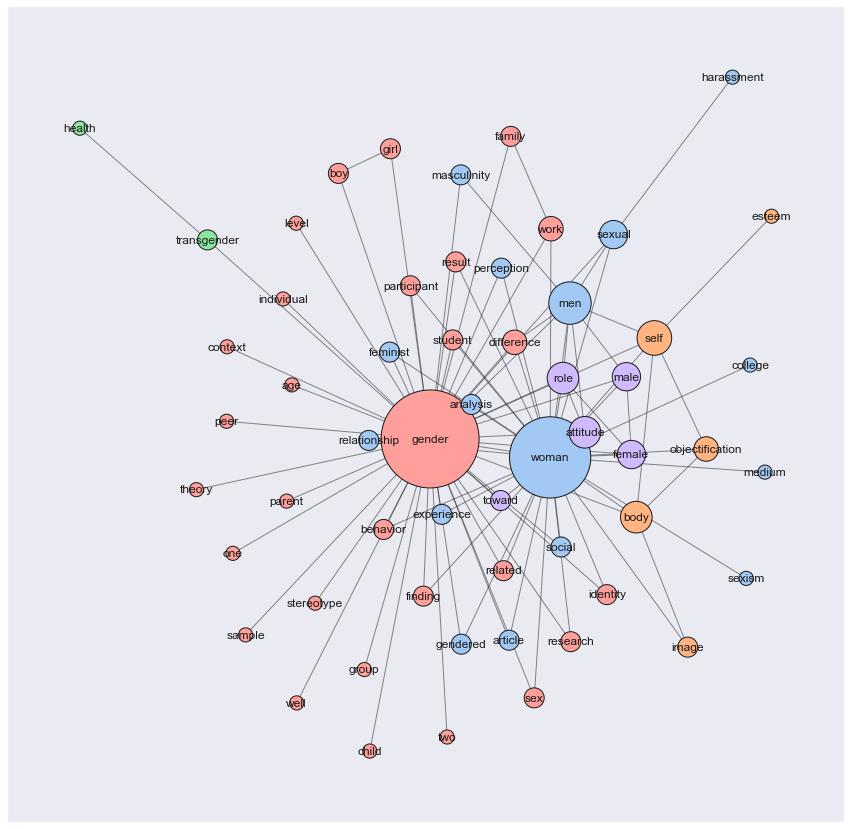

Geometry


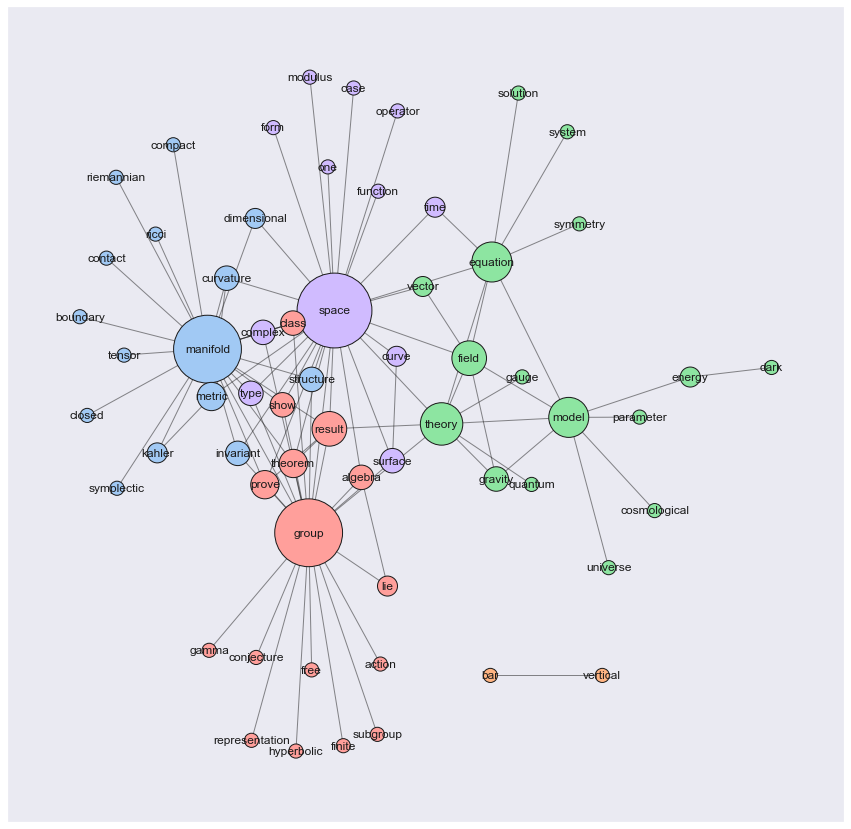

Geophysics


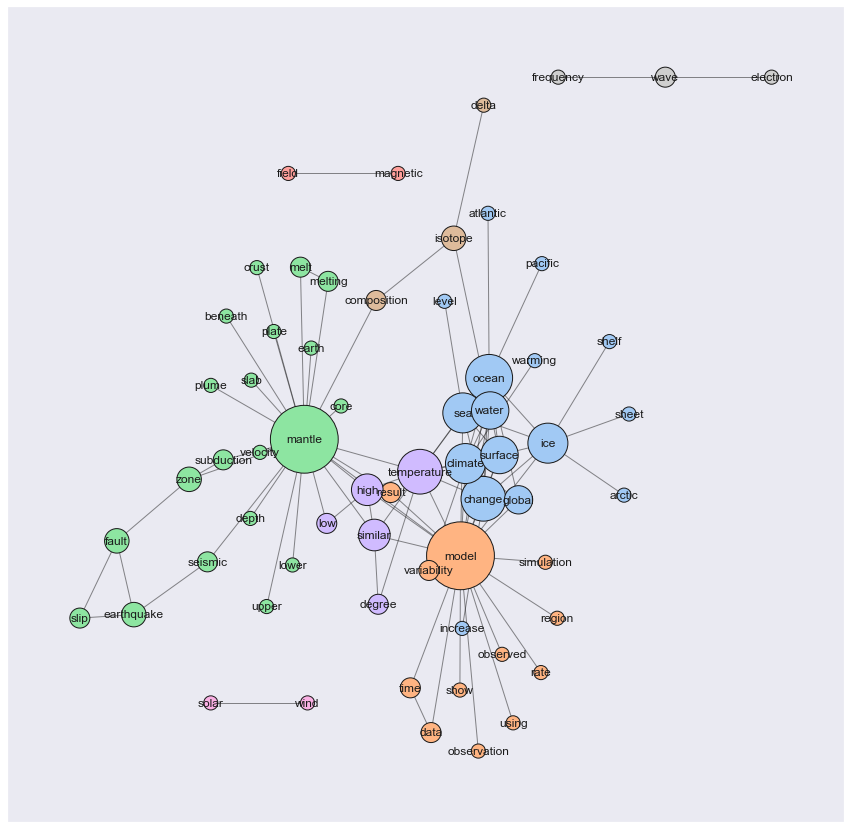

Economics


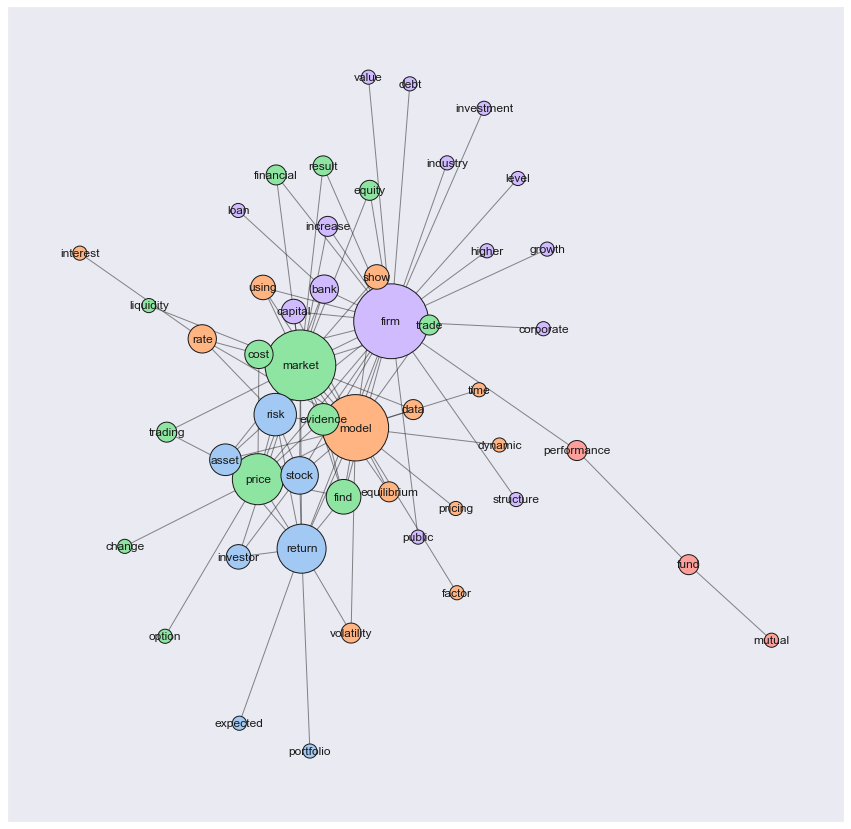

Language & Linguistics


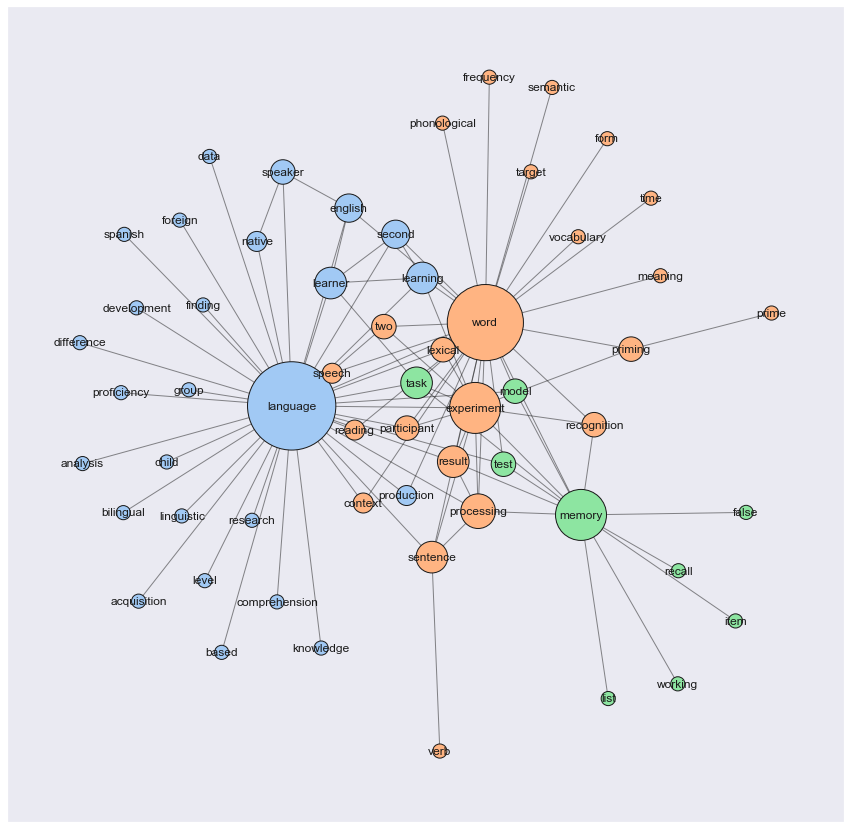

Probability & Statistics


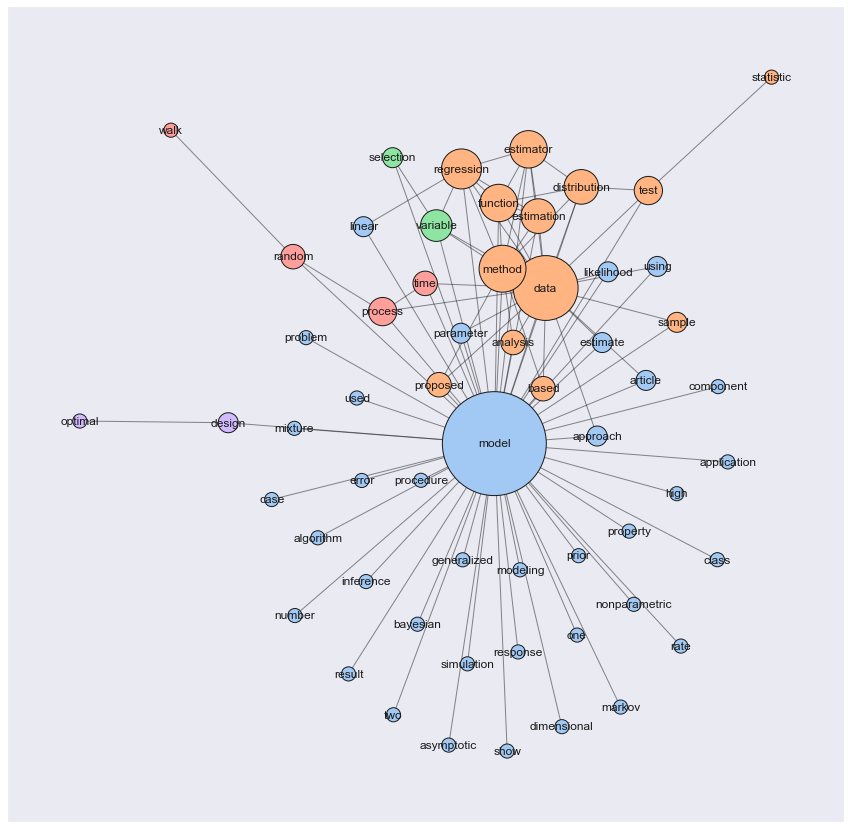

Material Engineering


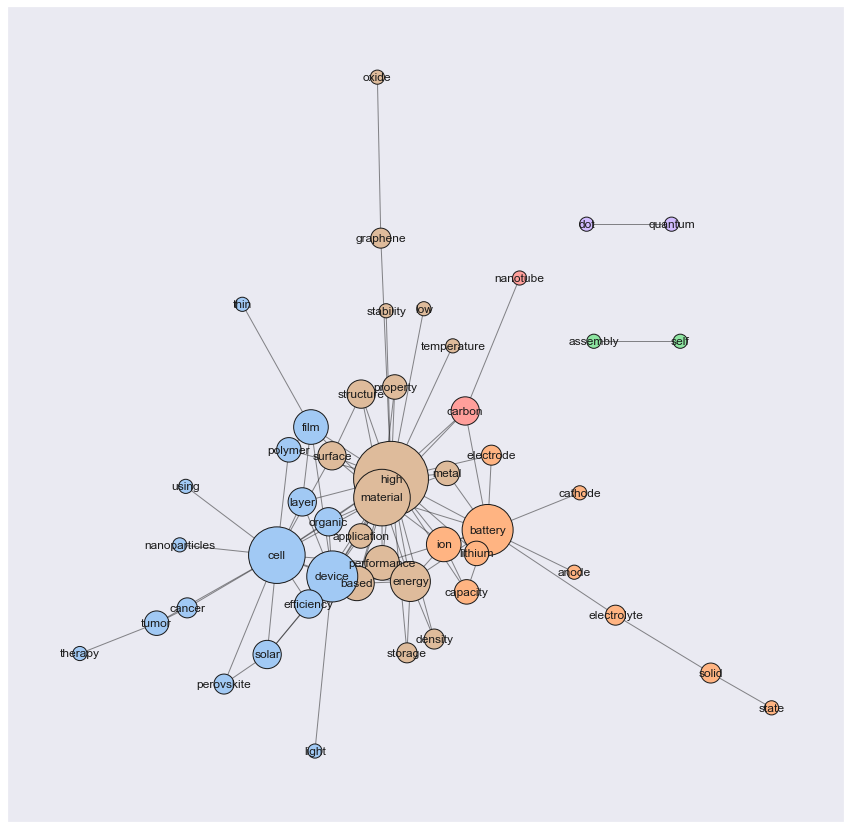

Artificial Intelligence


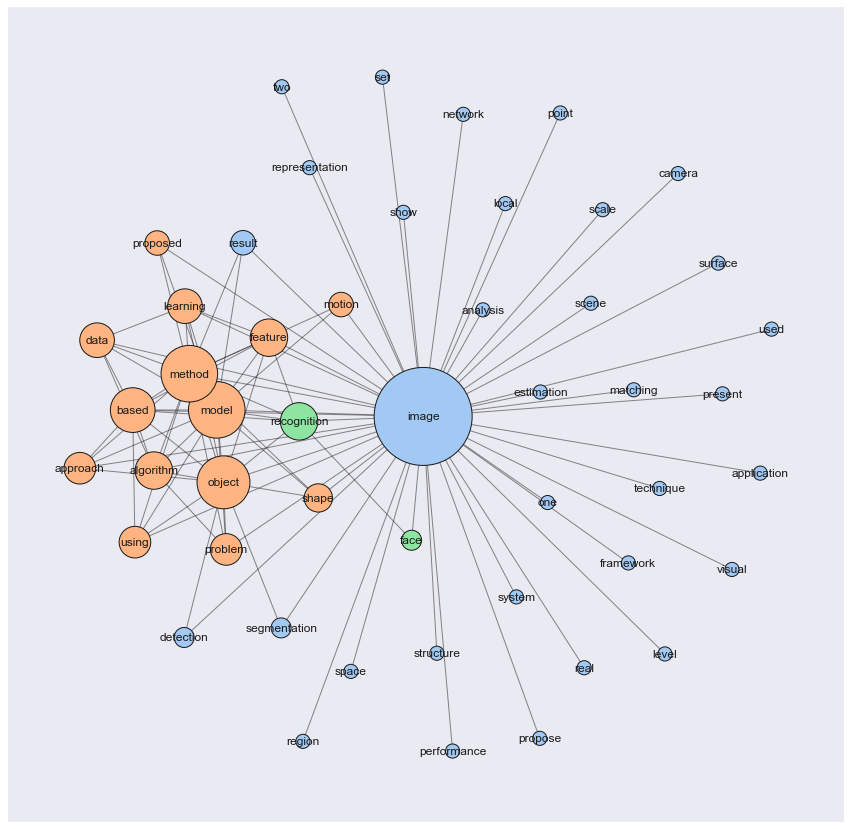

Sociology


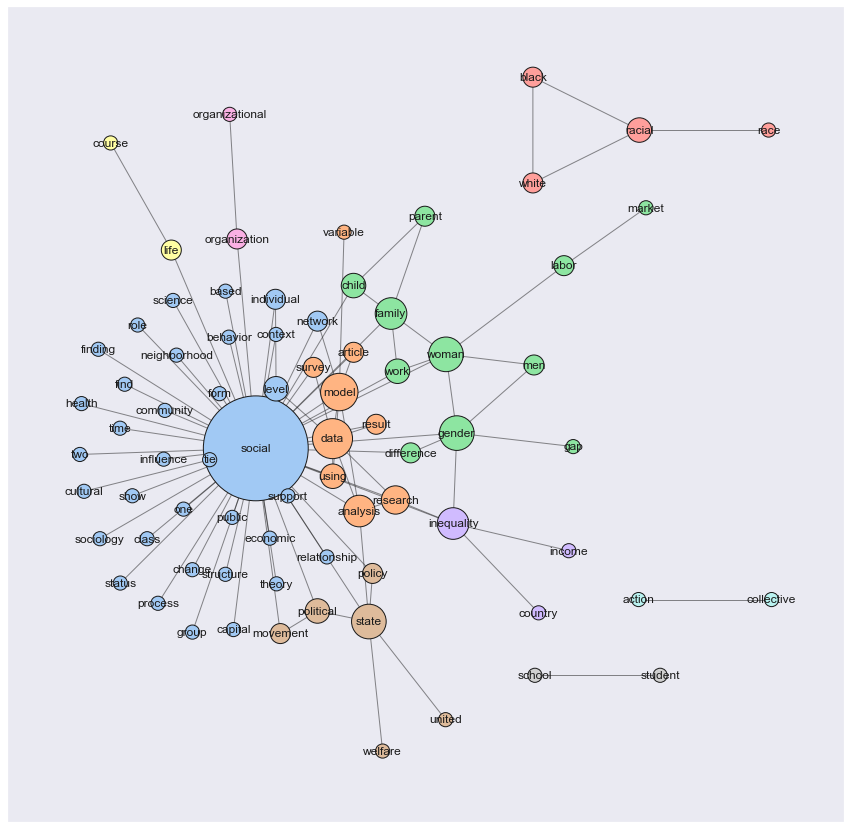

International Business


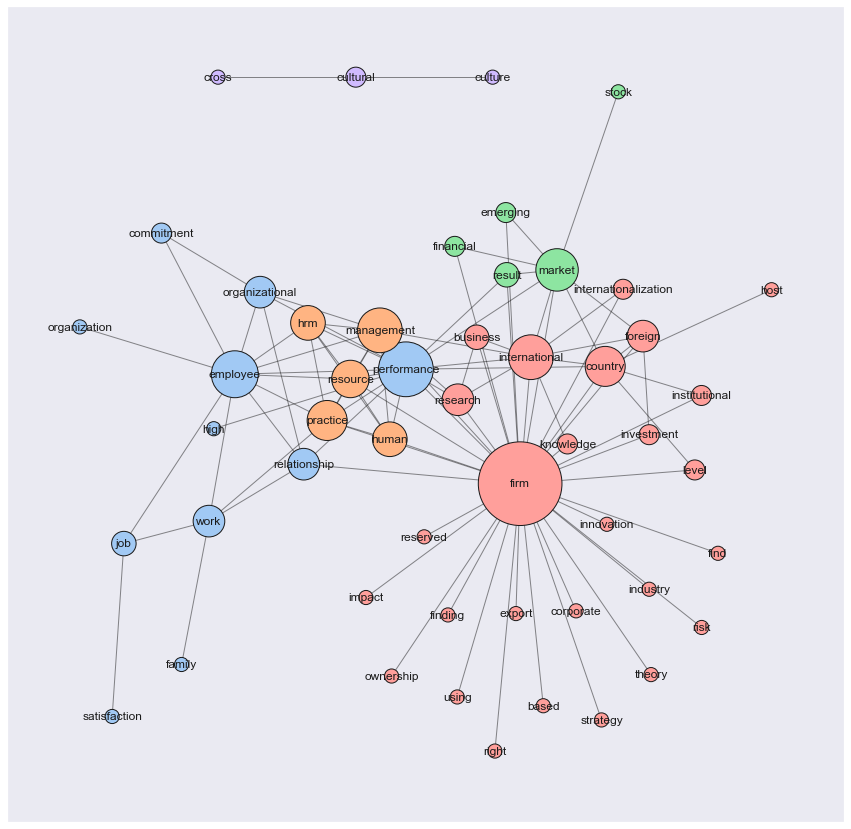

Political Science


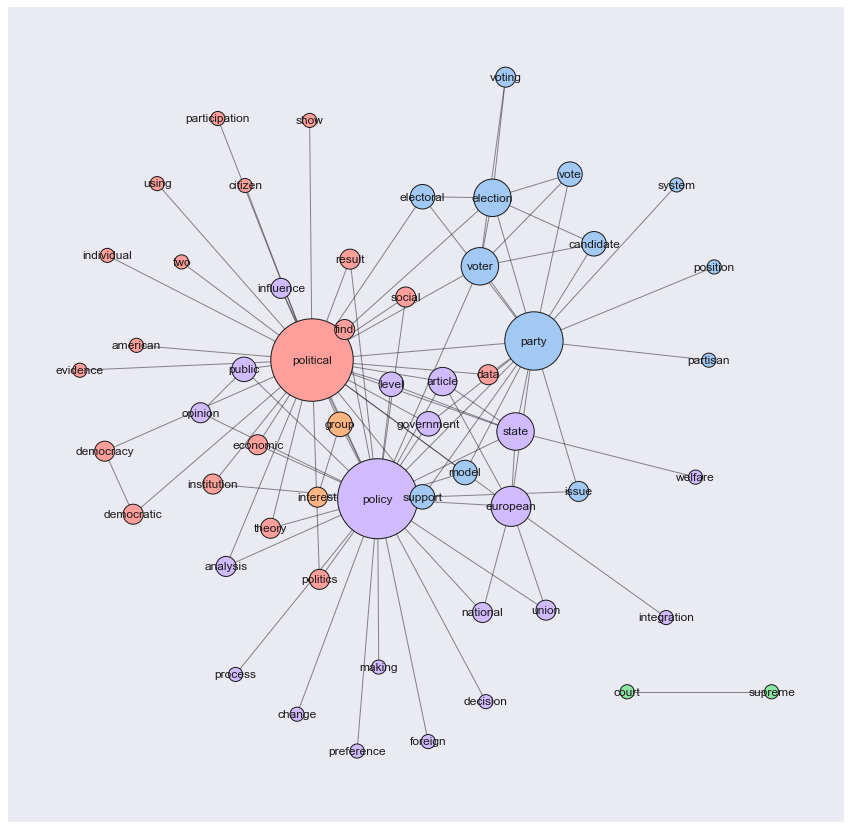

Genetics & Genomics


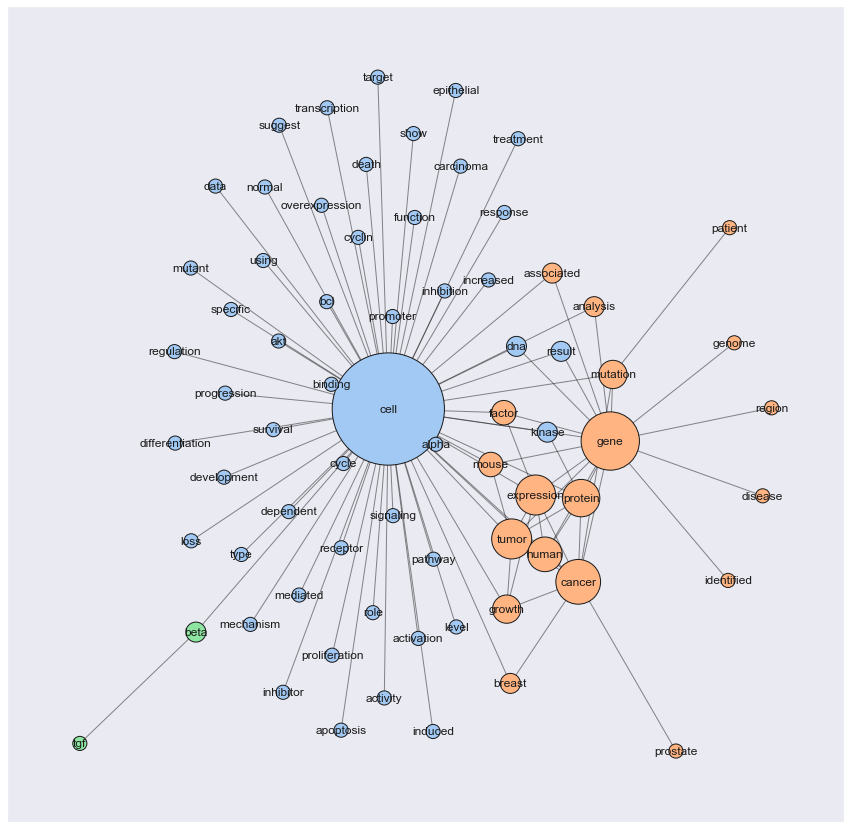

Immunology


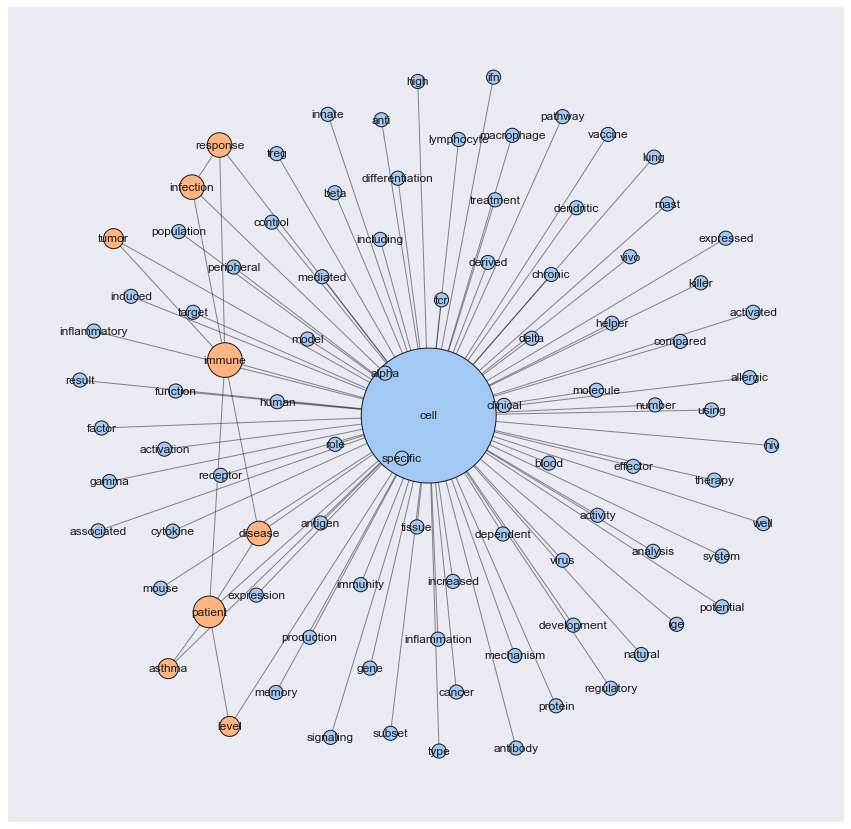

Human Resources & Organizations


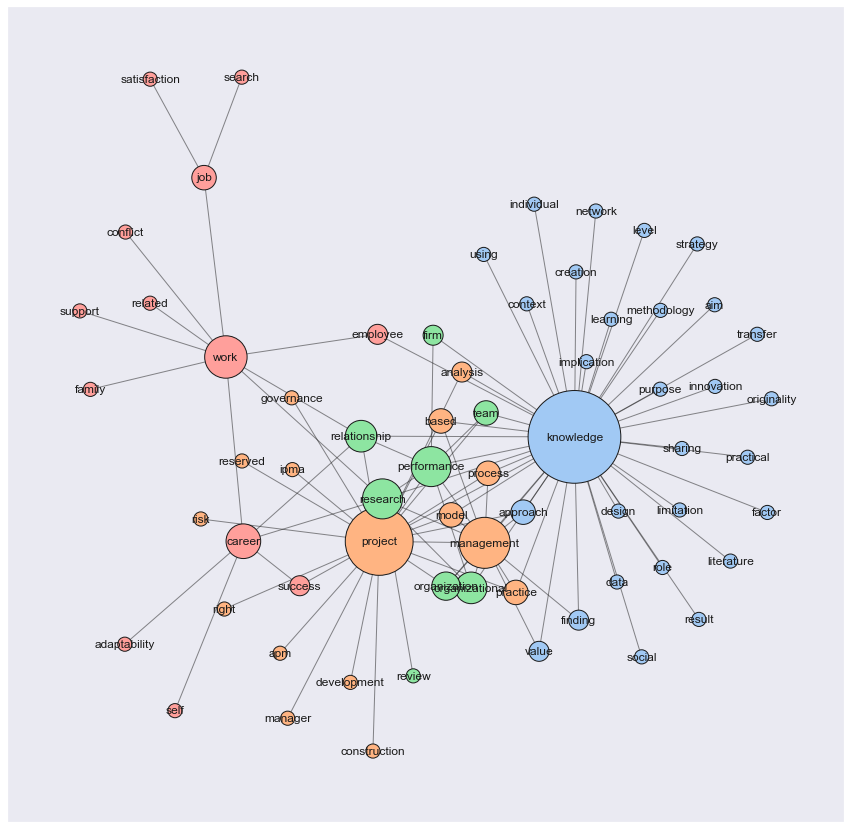

Ethnic & Cultural Studies


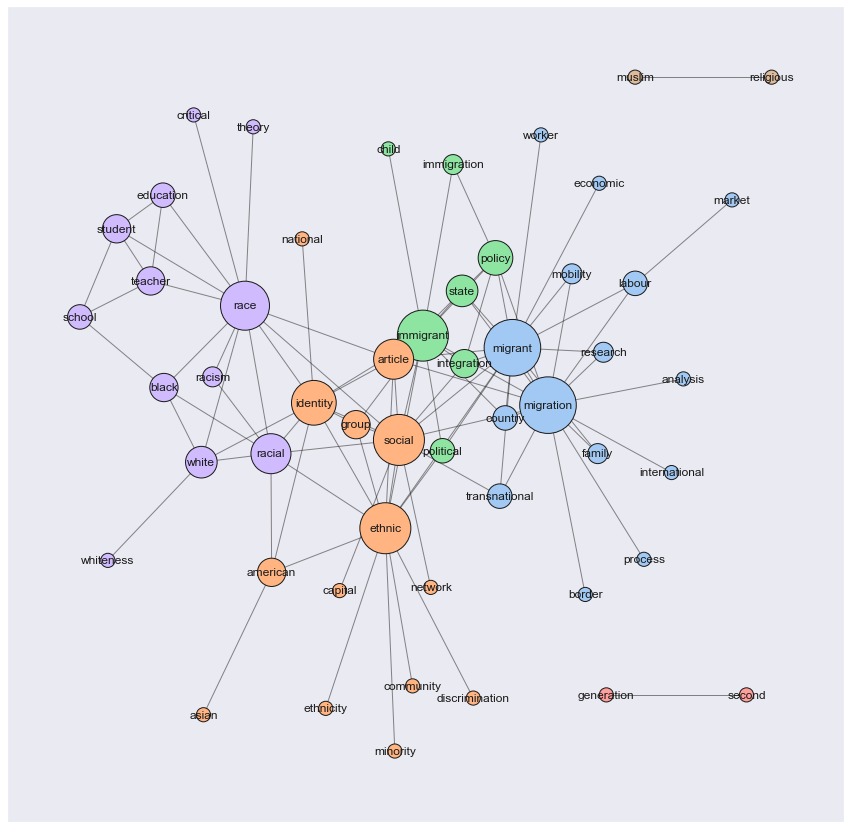

Neurology


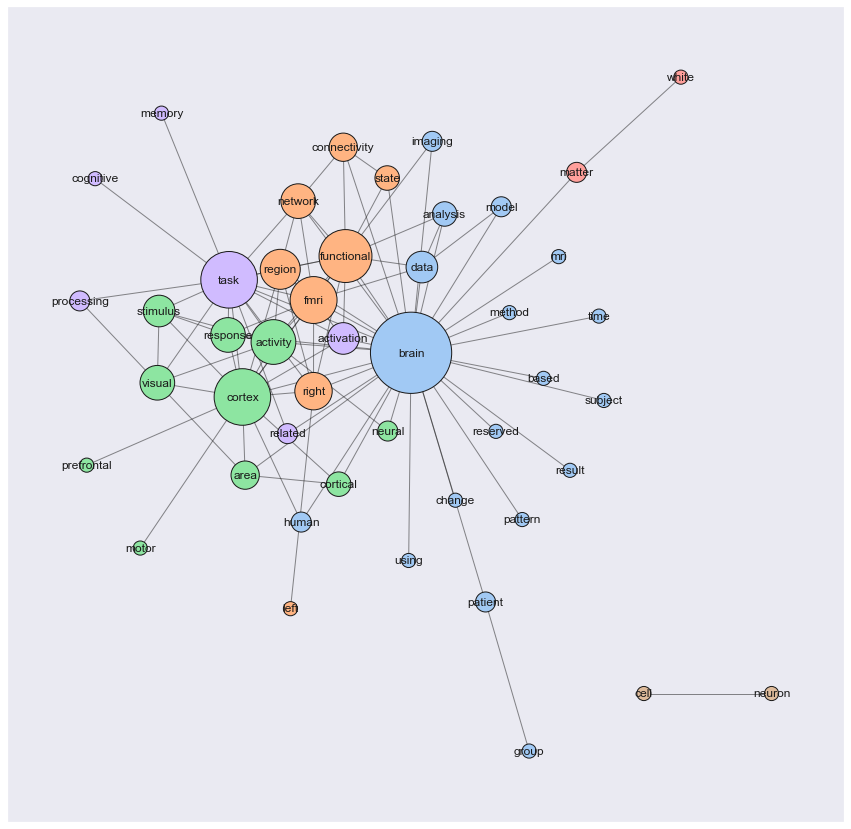

In [17]:
communities=True
co_citation=False

for field_name, G in Gs.items():

    print(field_name)
    
    fig, ax = plt.subplots(1, figsize=(15, 15))

    node_deg = dict(nx.degree(G))
    node_names = list(node_deg.keys())
    node_sizes = list(map(lambda deg: deg*200, node_deg.values()))
    node_labels = dict(zip(node_names, node_names))

    new_node_labels = (
        pl.read_parquet(f'./output/main_dfs/{field_name}.parquet')
        .select(
            pl.col('Doi'), 
            pl.concat_str([
                pl.lit('('),
                pl.col('Authors').arr.first().str.split(', ').arr.first(),
                pl.lit(', '),
                pl.col('Date').dt.year(),
                pl.lit(')')
            ])
        )
        .filter(pl.col('Doi').is_in(node_names))
        .to_numpy()
    )

    new_node_labels = dict(map(tuple, new_node_labels))
    if co_citation:
        node_labels.update(new_node_labels)

    if communities:
        comms = nx_comm.louvain_communities(G)
        palette = sns.color_palette("pastel", len(comms))
        node_color_map = {}
        for comm, color in zip(comms, palette):
            for node in comm:
                node_color_map[node] = color
        node_color = [node_color_map[n] for n in G.nodes]
        node_color

    pos = nx.nx_agraph.graphviz_layout(G, prog='sfdp') # dot, twopi, fdp, sfdp, circo

    nx.draw_networkx_nodes(
        G, 
        pos,
        nodelist=node_names,
        node_size=node_sizes,
        # node_color='#00ABB3',
        node_color=node_color,
        node_shape='o',
        alpha=None,
        cmap=plt.cm.Blues,
        ax=ax,
        linewidths=1.0,
        edgecolors='k',
    ).set_zorder(1)

    nx.draw_networkx_labels(G, pos=pos, ax=ax, labels=node_labels)

    nx.draw_networkx_edges(
        G, 
        pos,
        width=1.0,
        edge_color='k',
        style='solid',
        alpha=0.5,
        arrowsize=10,
        ax=ax,
        nodelist=node_names,
        node_size=node_sizes,
        node_shape='o',
        connectionstyle='arc3',
    ).set_zorder(-1)

    ax.grid(False)

    # plt.savefig(
    #     os.path.join(LATEX_FIGURES_PATH, 'co_occurrence_graphs', f'{field_name.capitalize()}.png'), 
    #     transparent=True, 
    #     dpi=150 
    # )

    plt.show()

# Full Co-Occurrence Bundled Graphs

In [7]:
corpora = co_occurence_graphs(n_edges=1000)
Gs = {field_name: corpus['G'] for (field_name, corpus) in corpora.items()}
Dfs = {field_name: corpus['Df'] for (field_name, corpus) in corpora.items()}

Gender Studies Graph with 340 nodes and 1000 edges
Geometry Graph with 237 nodes and 1000 edges
Geophysics Graph with 229 nodes and 1000 edges
Economics Graph with 249 nodes and 1000 edges
Language & Linguistics Graph with 249 nodes and 1000 edges
Probability & Statistics Graph with 253 nodes and 1000 edges
Material Engineering Graph with 215 nodes and 1000 edges
Artificial Intelligence Graph with 224 nodes and 1000 edges
Sociology Graph with 273 nodes and 1000 edges
International Business Graph with 219 nodes and 1000 edges
Political Science Graph with 252 nodes and 1000 edges
Genetics & Genomics Graph with 328 nodes and 1000 edges
Immunology Graph with 448 nodes and 1000 edges
Human Resources & Organizations Graph with 258 nodes and 1000 edges
Ethnic & Cultural Studies Graph with 216 nodes and 1000 edges
Neurology Graph with 178 nodes and 1000 edges


Gender Studies 7


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/netgraph/_edge_layout.py:978: RuntimeWarning: invalid value encountered in true_divide
  displacement = compatibility * delta / distance_squared[..., None]
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/netgraph/_utils.py:360: RuntimeWarning: invalid value encountered in true_divide
  v = v / np.linalg.norm(v, axis=-1)[:, None] # unit vector


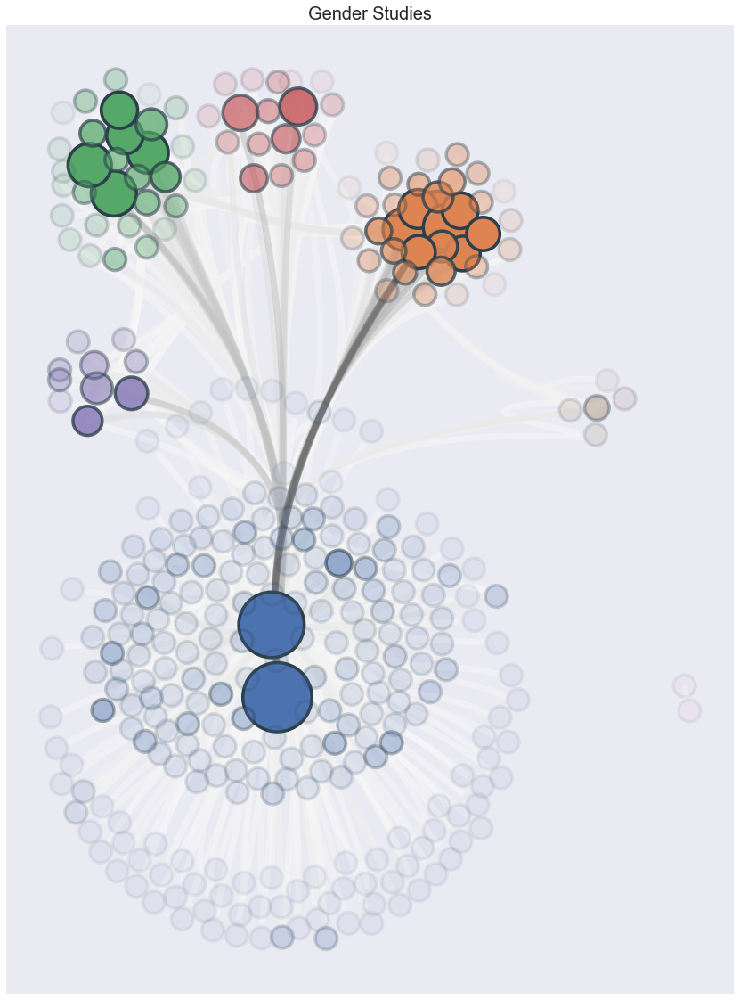

Geometry 9


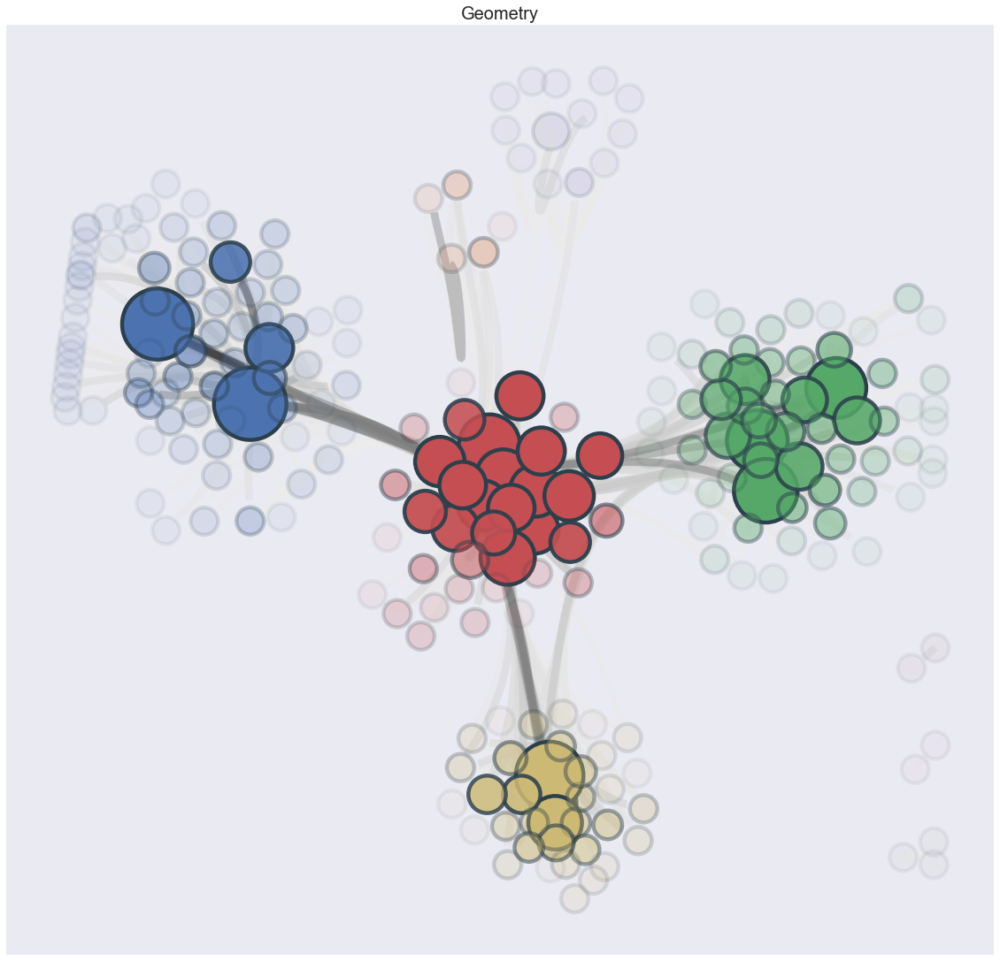

Geophysics 10


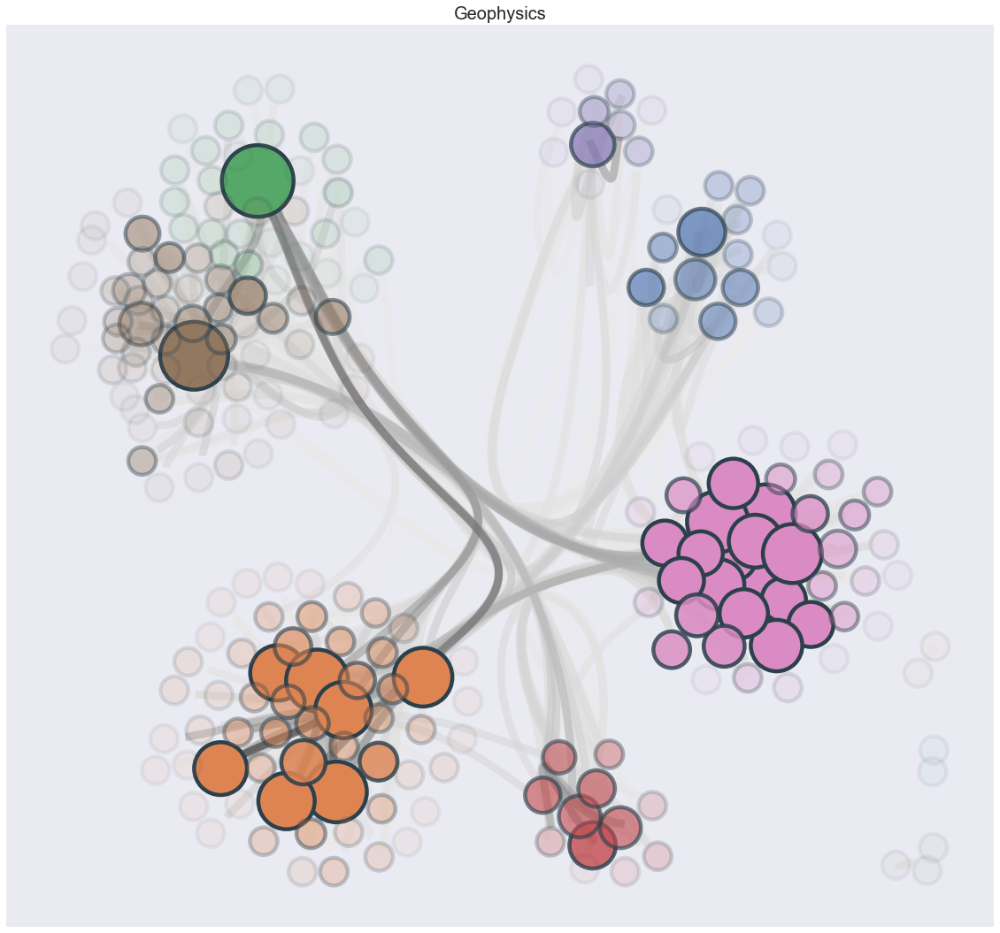

Economics 8


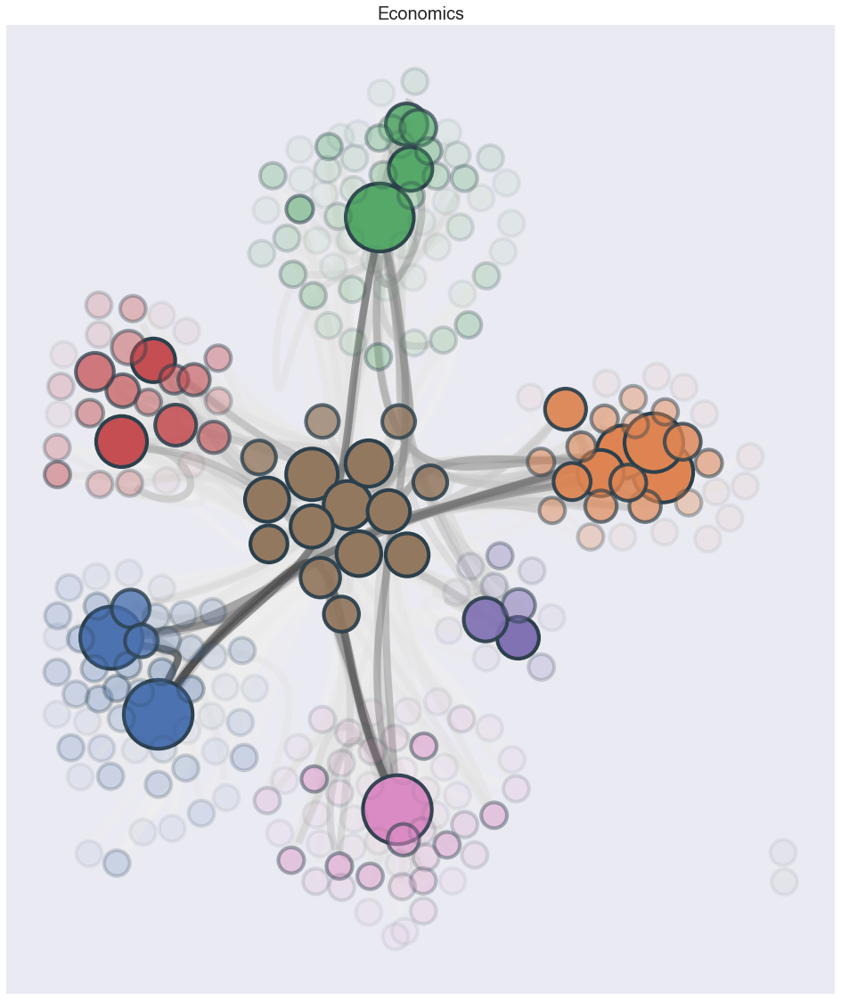

Language & Linguistics 4


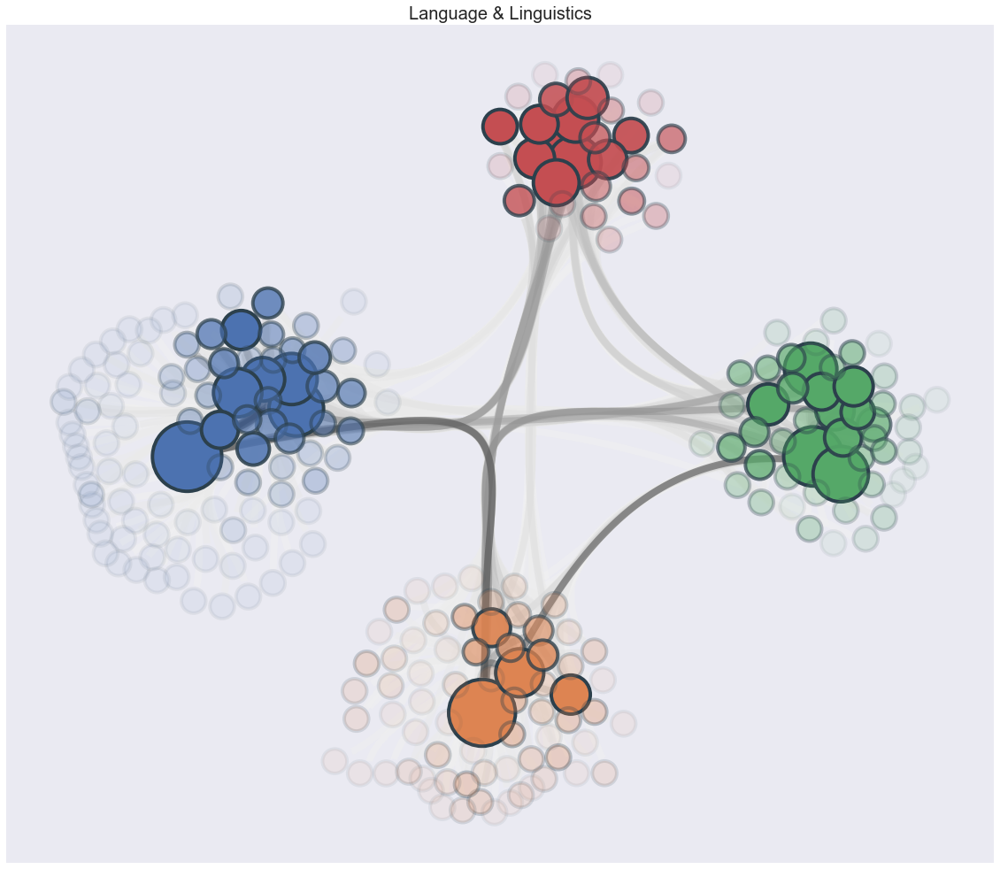

Probability & Statistics 7


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/netgraph/_node_layout.py:1023: RuntimeWarning: invalid value encountered in true_divide
  directions = deltas / magnitudes[:, np.newaxis]


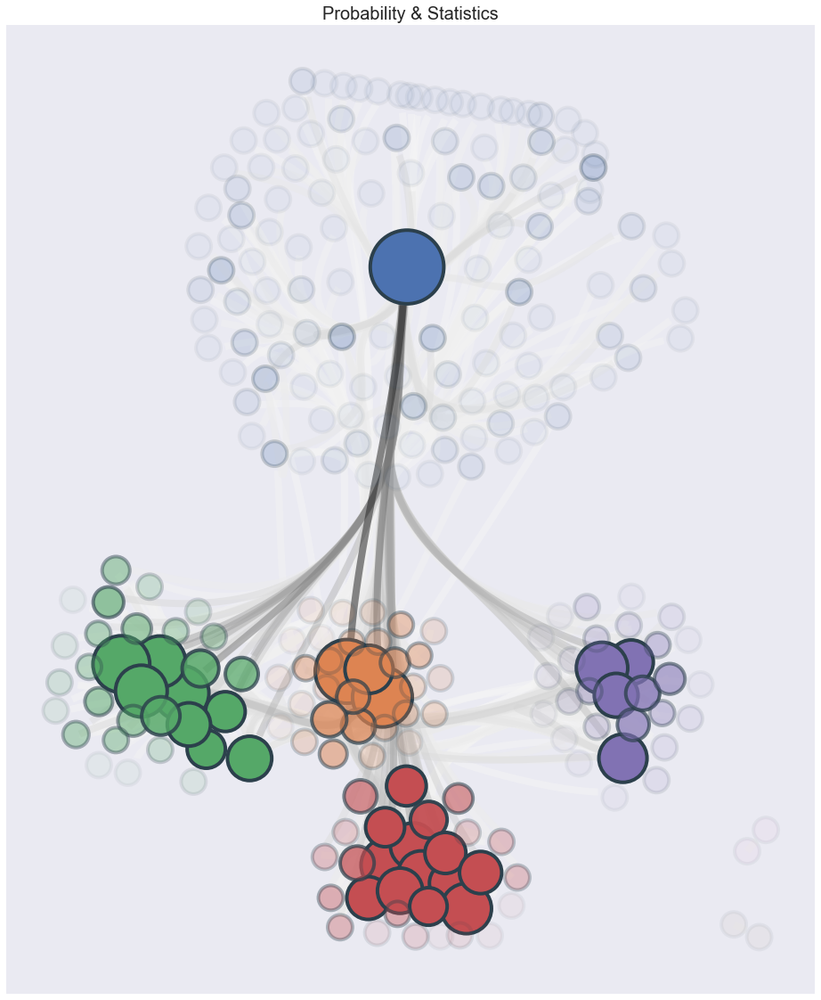

Material Engineering 6


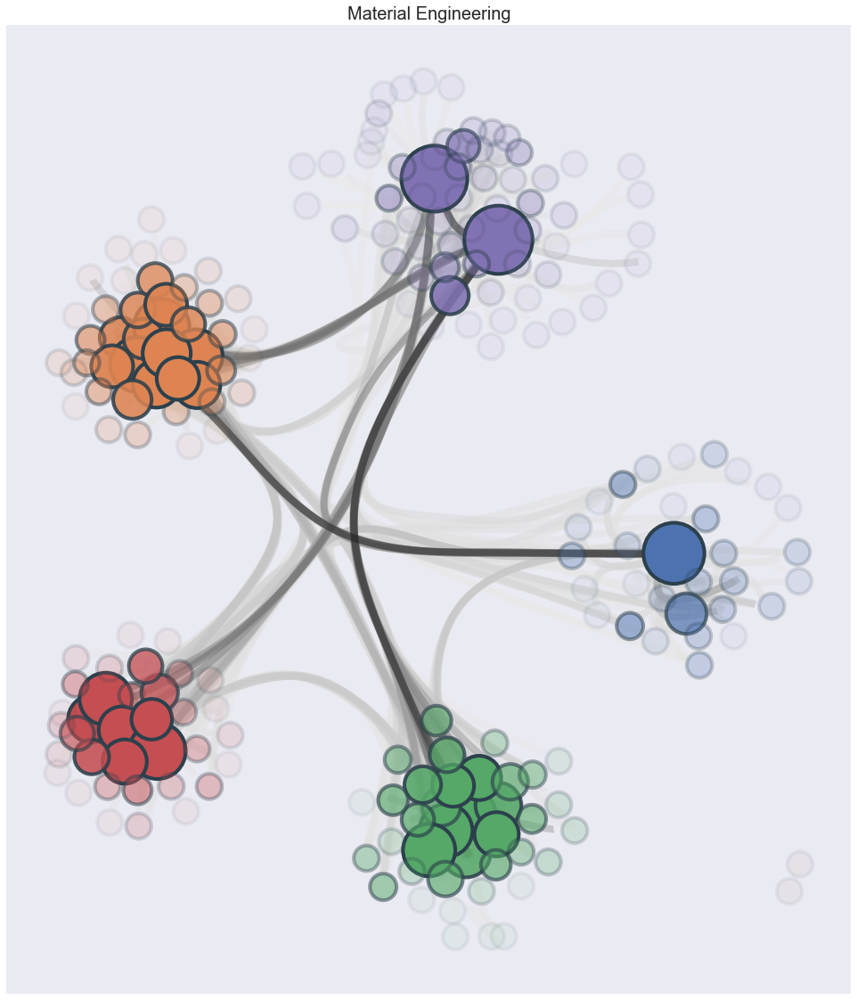

Artificial Intelligence 5


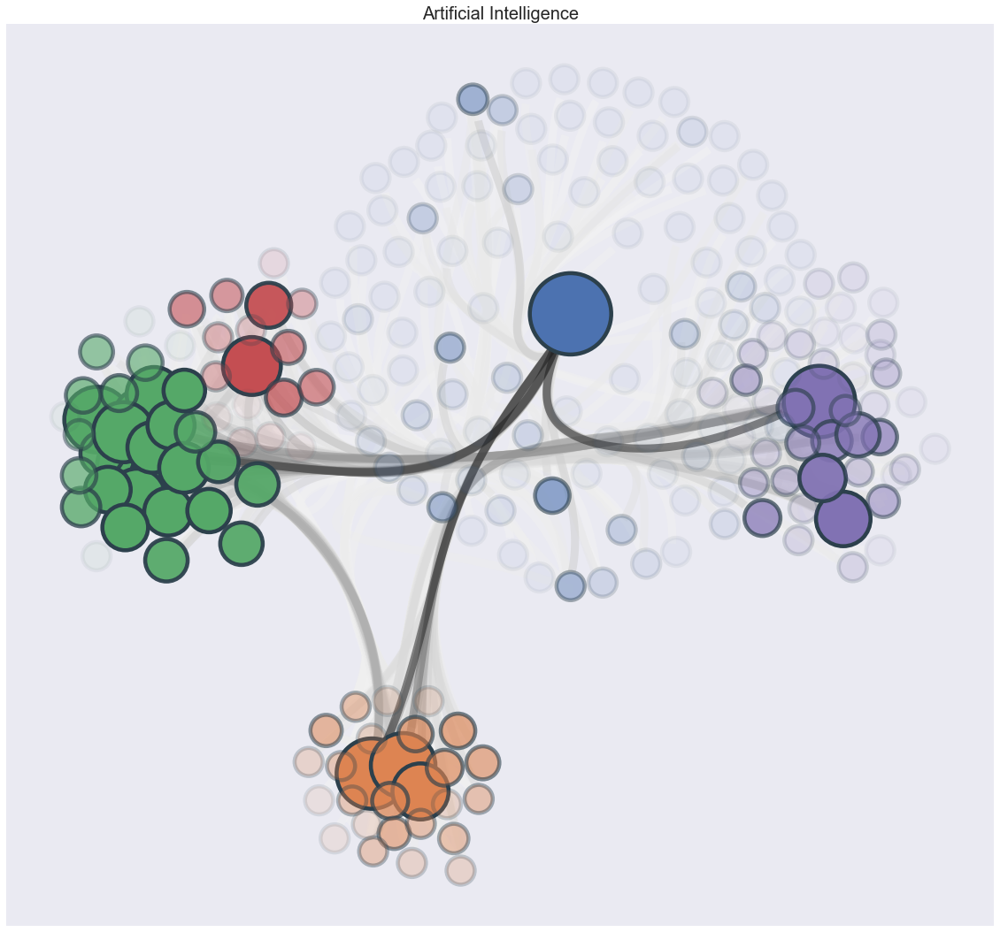

Sociology 7


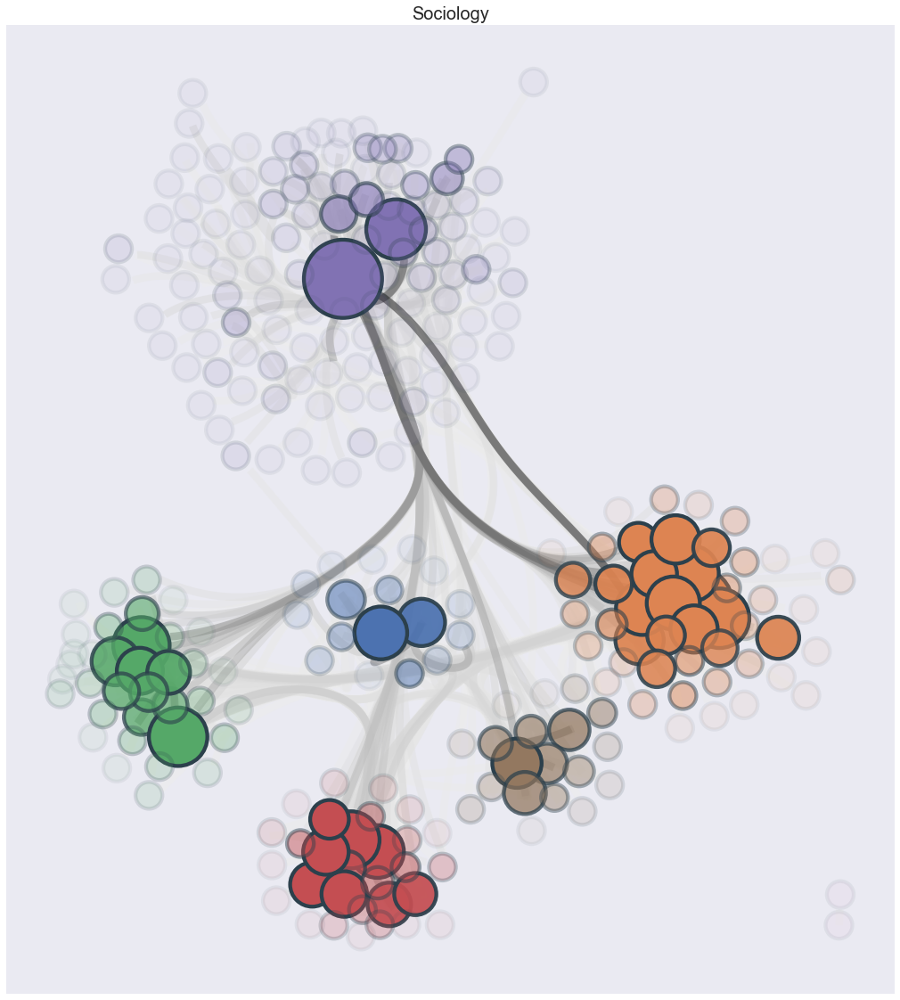

International Business 6


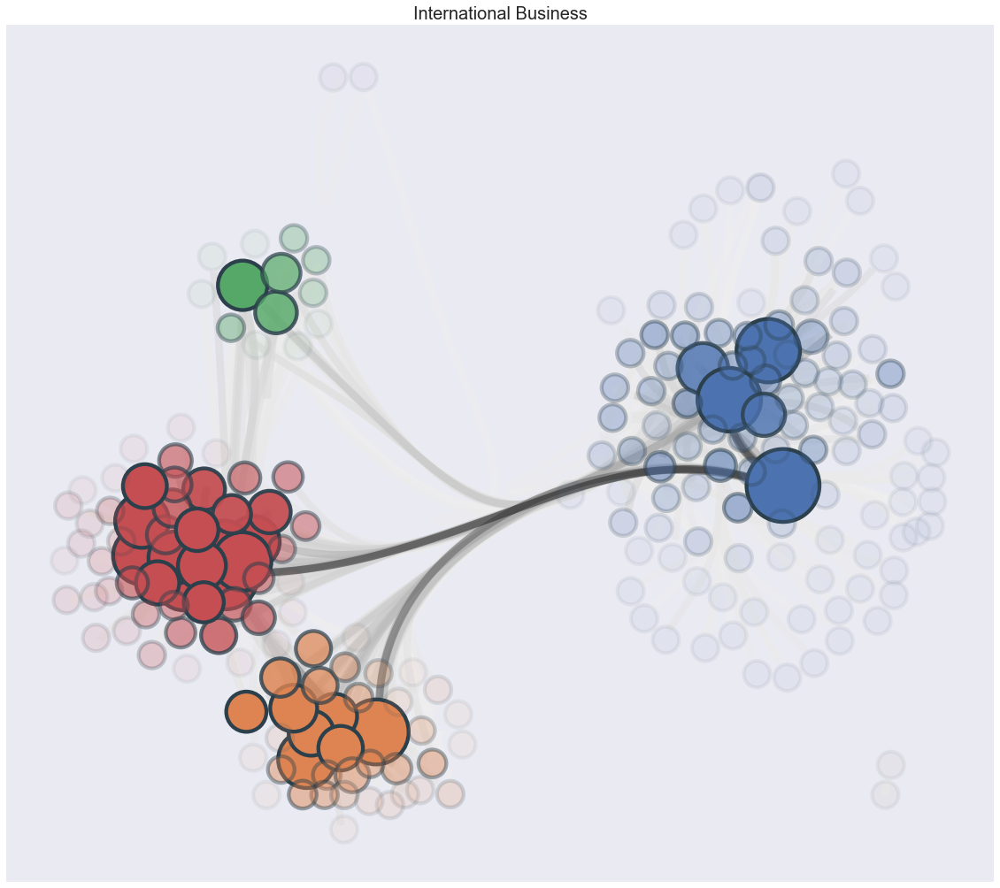

Political Science 5


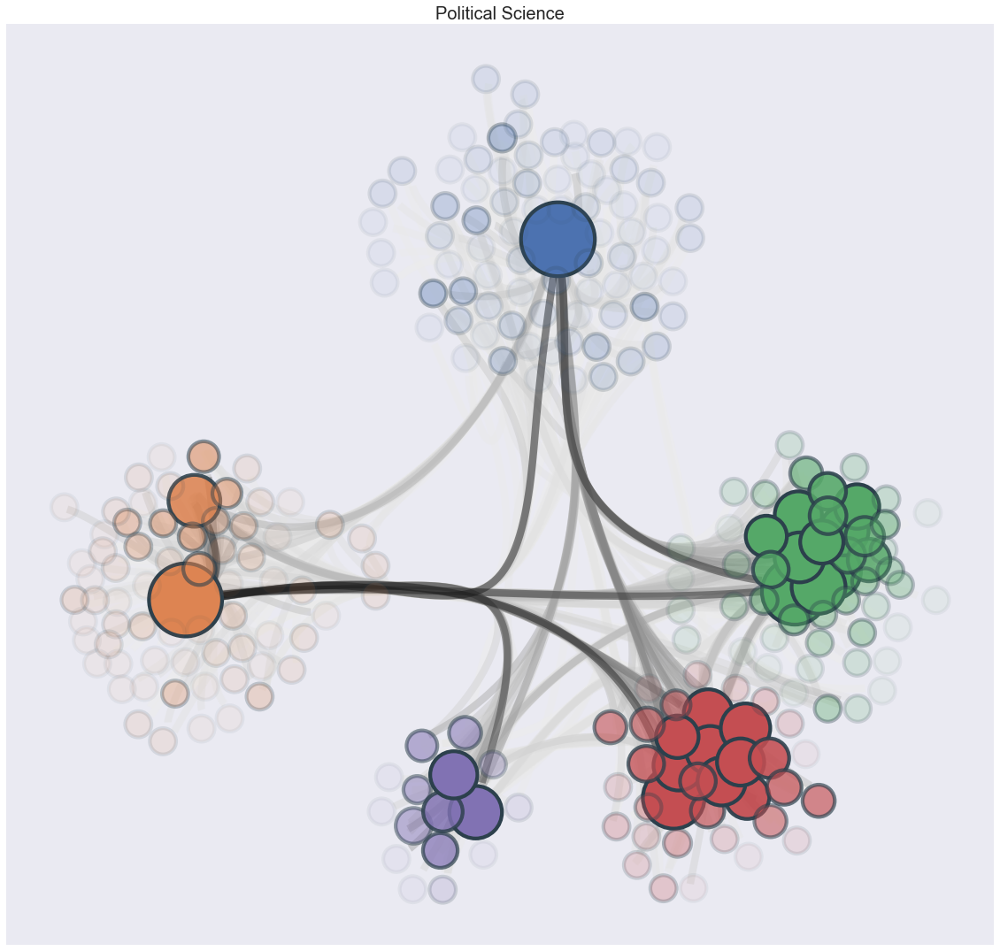

Genetics & Genomics 5


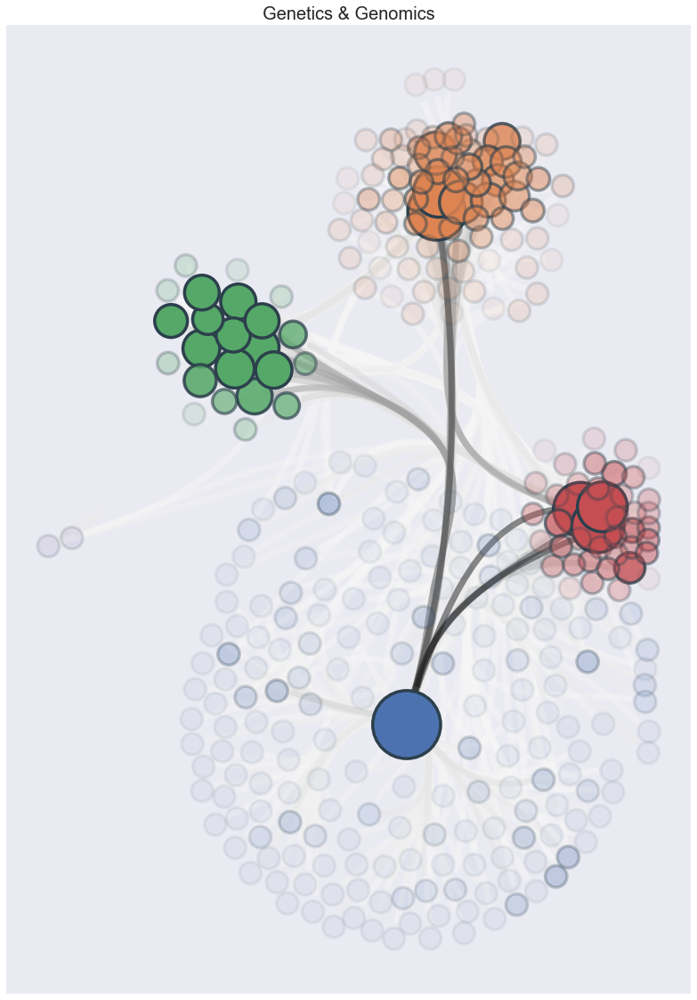

Immunology 5


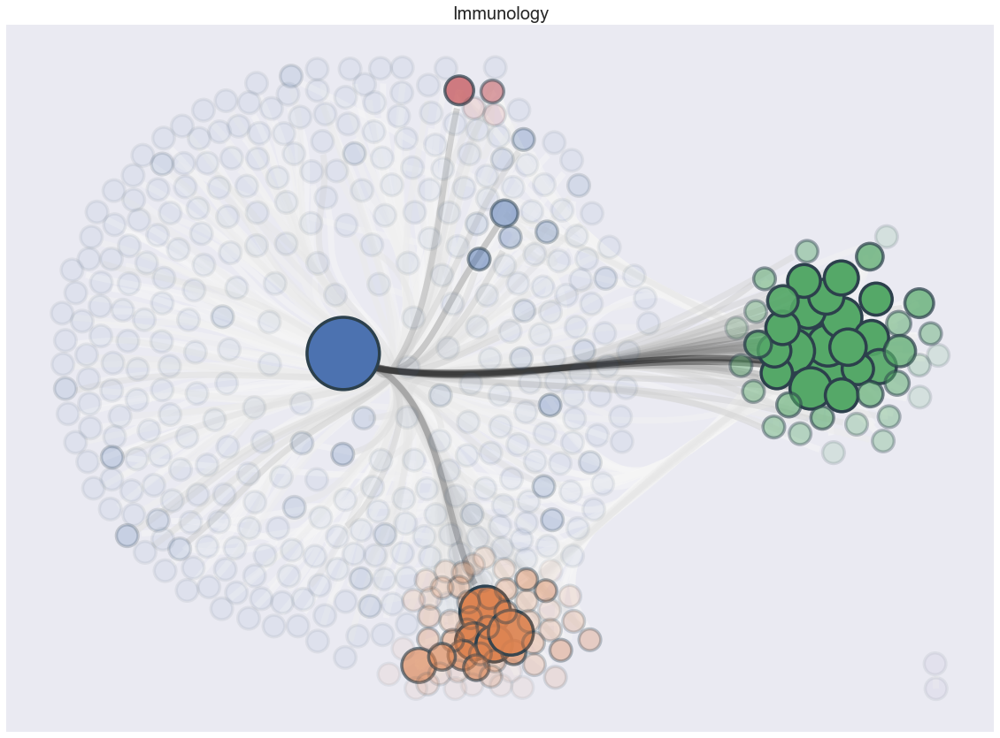

Human Resources & Organizations 4


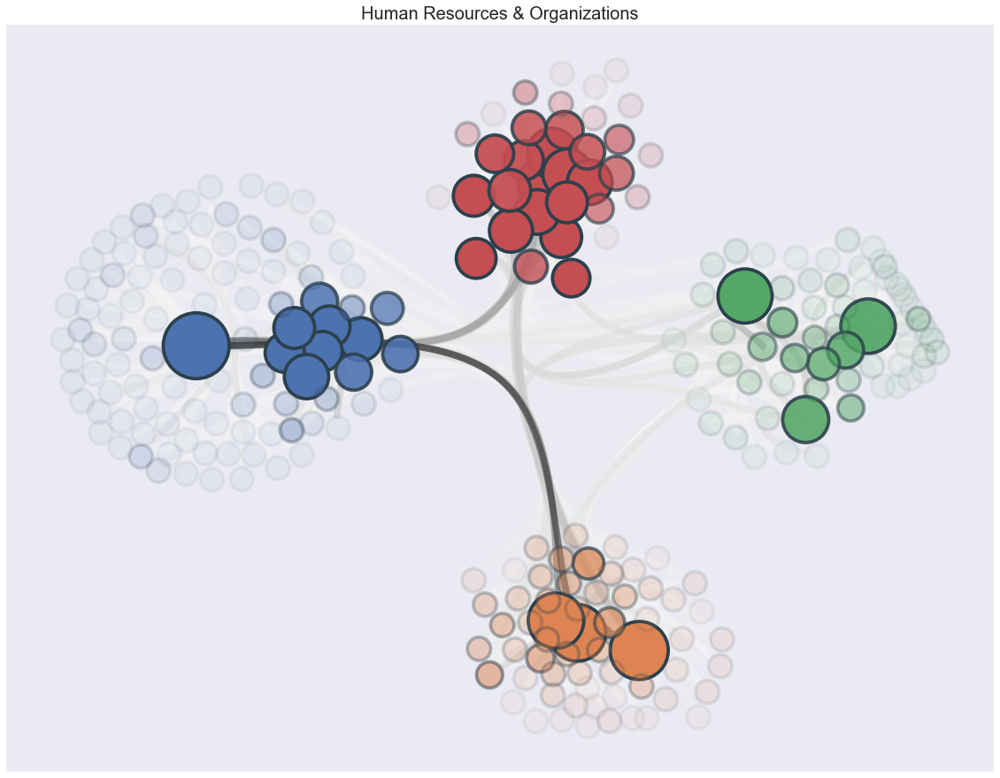

Ethnic & Cultural Studies 5


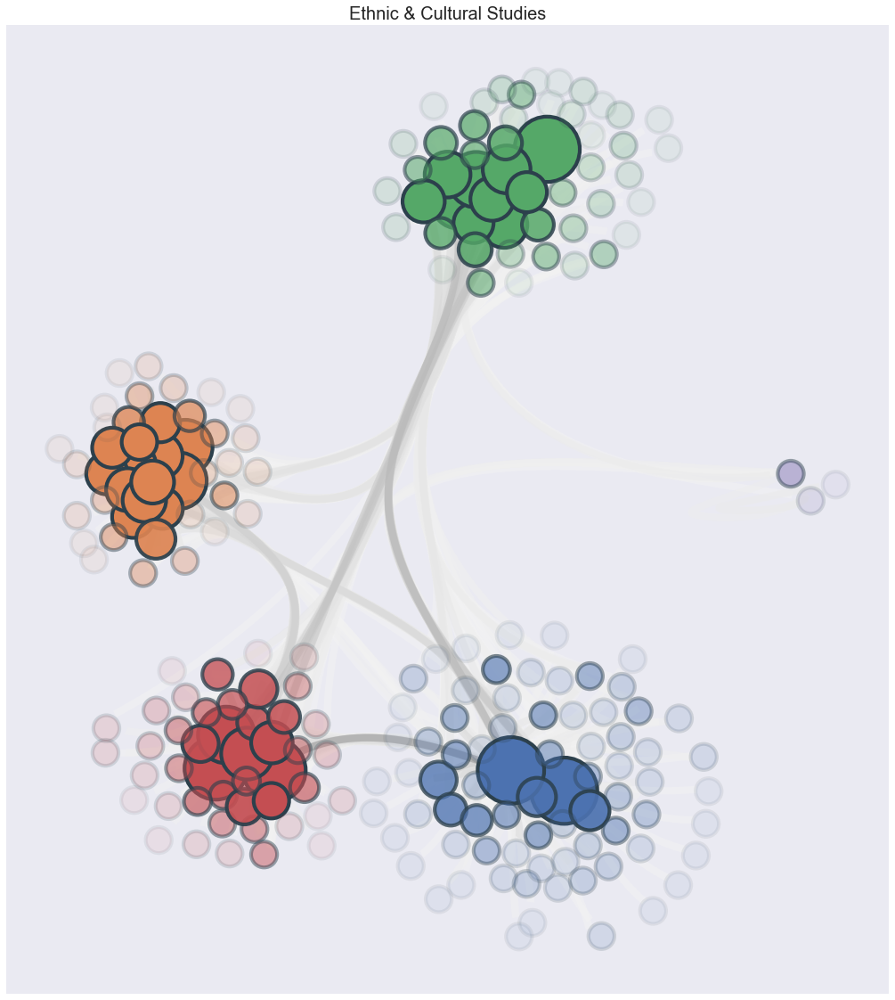

Neurology 7


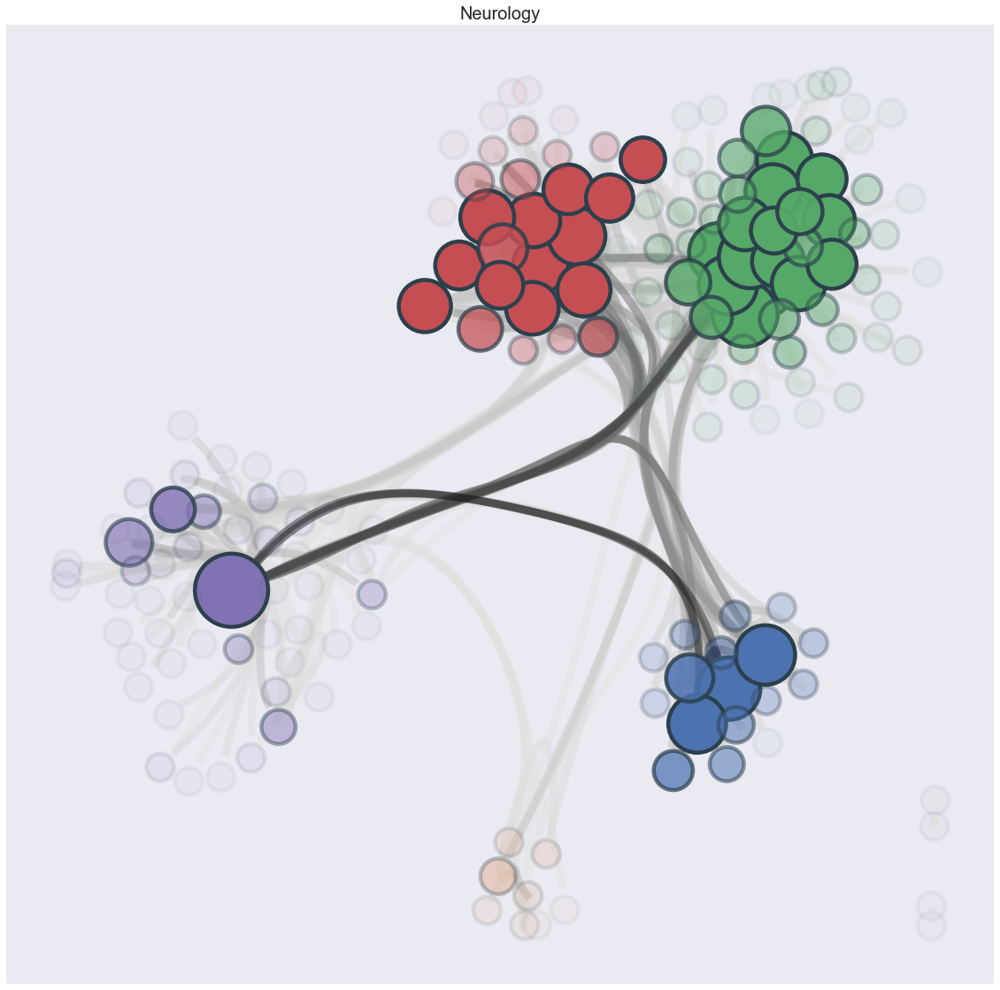

In [8]:
from netgraph import Graph, ArcDiagram
from itertools import accumulate
import operator
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

import seaborn as sns

field_comm_num = {}
for field_name, G in Gs.items():

    communities = nx_comm.louvain_communities(G)
    communities = {node: i for i, comm in enumerate(communities) for node in comm}

    num_comm = len(set(communities.values()))
    print(field_name, num_comm)
    field_comm_num[field_name] = num_comm

    node_size = dict(nx.degree(G))
    node_size = {node: max(2, np.log(size)) for node, size in node_size.items()}

    comm_color = sns.color_palette()
    node_color = {node: comm_color[i] for node, i in communities.items()}

    node_alpha = nx.core_number(G)
    max_core = max(node_alpha.values())
    node_alpha = {n: core / max_core for n, core in node_alpha.items()}

    node_labels = dict(zip(G.nodes, G.nodes))

    fig, ax = plt.subplots(figsize=(20, 20))

    Graph(
        G,
        edge_layout='bundled',
        node_layout='community',
        node_size=node_size,
        node_color=node_color,
        # node_labels=True,
        # node_label_fontdict={'size': 15},
        # node_label_offset=0.00,
        node_alpha=node_alpha,
        ax=ax,
        node_layout_kwargs=dict(node_to_community=communities)
    )

    plt.title(field_name, fontsize=20)

    # plt.savefig(
    #     os.path.join(LATEX_FIGURES_PATH, 'co_occurrence_graphs_bundled', f'{field_name.capitalize()}.png'), 
    #     transparent=True, 
    #     dpi=150 
    # )

    plt.show()

# Full Co-Occurrence Graphs

In [11]:
corpora = co_occurence_graphs(n_edges=10_000)
Gs = {field_name: corpus['G'] for (field_name, corpus) in corpora.items()}
Dfs = {field_name: corpus['Df'] for (field_name, corpus) in corpora.items()}

Gender Studies Graph with 1378 nodes and 10000 edges
Geometry Graph with 983 nodes and 10000 edges
Geophysics Graph with 896 nodes and 10000 edges
Economics Graph with 996 nodes and 10000 edges
Language & Linguistics Graph with 1010 nodes and 10000 edges
Probability & Statistics Graph with 912 nodes and 10000 edges
Material Engineering Graph with 881 nodes and 10000 edges
Artificial Intelligence Graph with 951 nodes and 10000 edges
Sociology Graph with 943 nodes and 10000 edges
International Business Graph with 822 nodes and 10000 edges
Political Science Graph with 1037 nodes and 10000 edges
Genetics & Genomics Graph with 1328 nodes and 10000 edges
Immunology Graph with 1595 nodes and 10000 edges
Human Resources & Organizations Graph with 1054 nodes and 10000 edges
Ethnic & Cultural Studies Graph with 919 nodes and 10000 edges
Neurology Graph with 854 nodes and 10000 edges


Gender Studies Graph with 1378 nodes and 10000 edges
Geometry Graph with 983 nodes and 10000 edges
Geophysics Graph with 896 nodes and 10000 edges
Economics Graph with 996 nodes and 10000 edges
Language & Linguistics Graph with 1010 nodes and 10000 edges
Probability & Statistics Graph with 912 nodes and 10000 edges
Material Engineering Graph with 881 nodes and 10000 edges
Artificial Intelligence Graph with 951 nodes and 10000 edges
Sociology Graph with 943 nodes and 10000 edges
International Business Graph with 822 nodes and 10000 edges
Political Science Graph with 1037 nodes and 10000 edges
Genetics & Genomics Graph with 1328 nodes and 10000 edges
Immunology Graph with 1595 nodes and 10000 edges
Human Resources & Organizations Graph with 1054 nodes and 10000 edges
Ethnic & Cultural Studies Graph with 919 nodes and 10000 edges
Neurology Graph with 854 nodes and 10000 edges


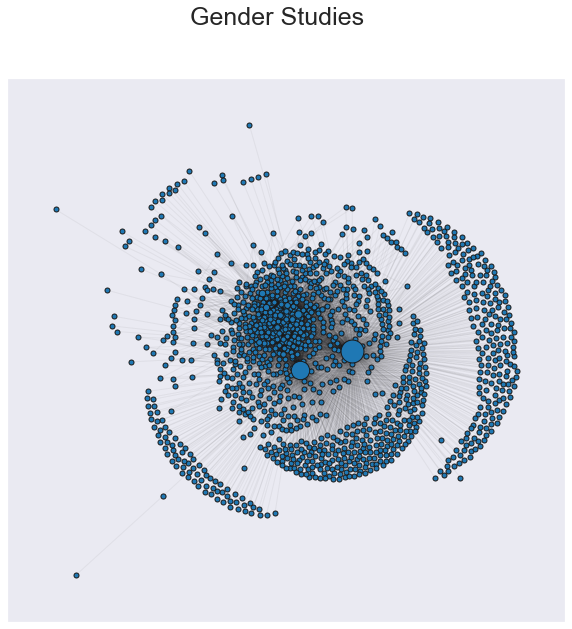

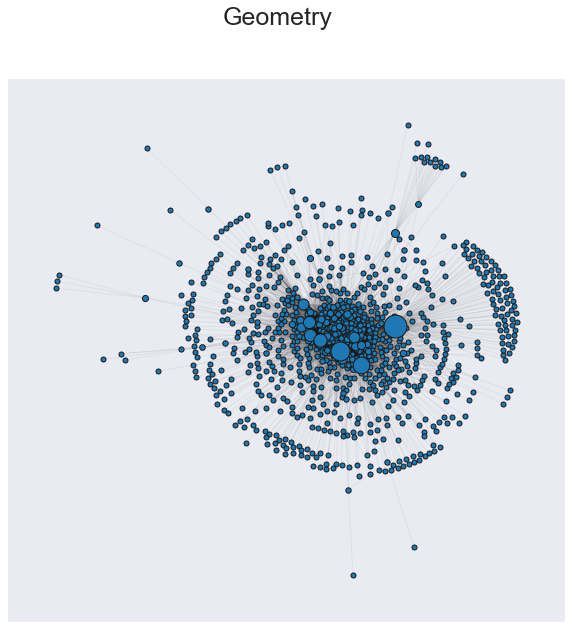

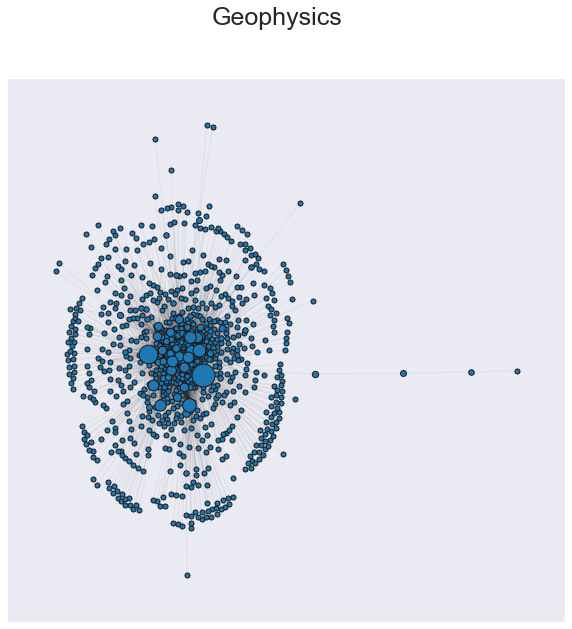

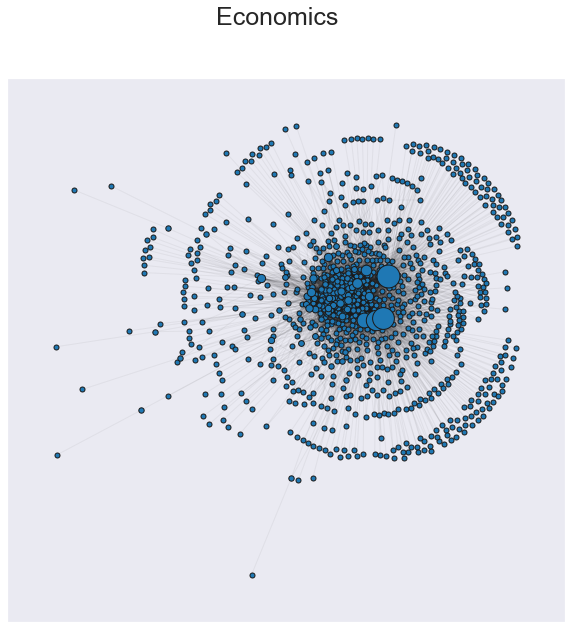

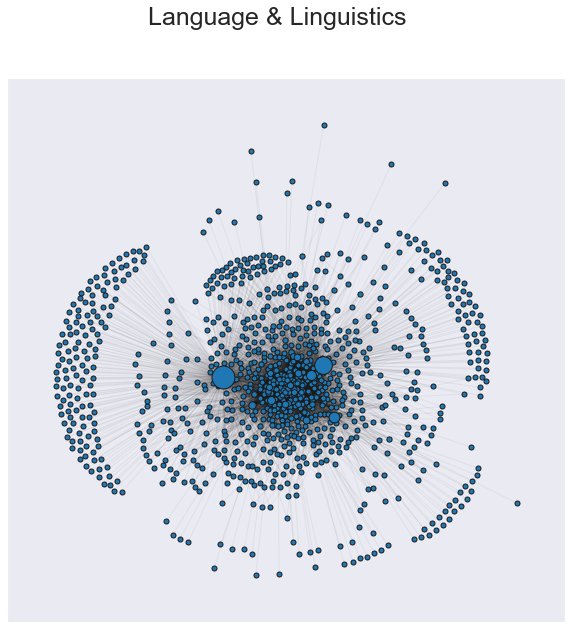

...

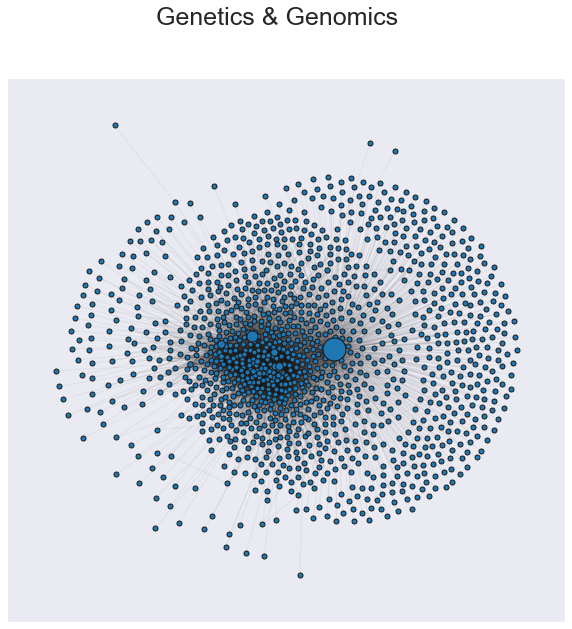

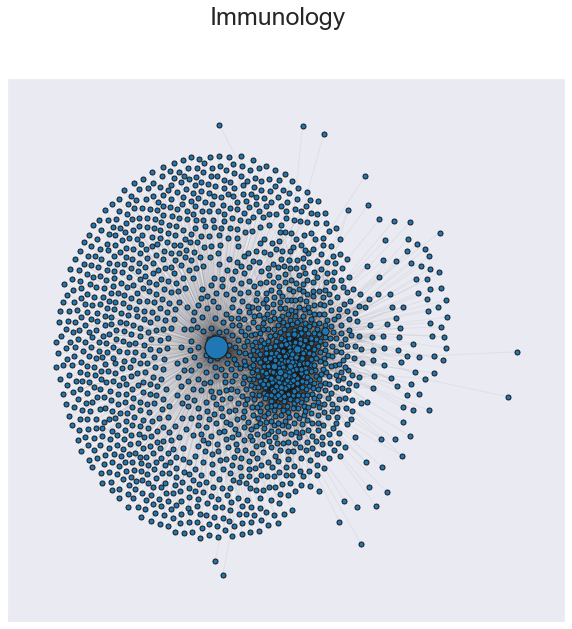

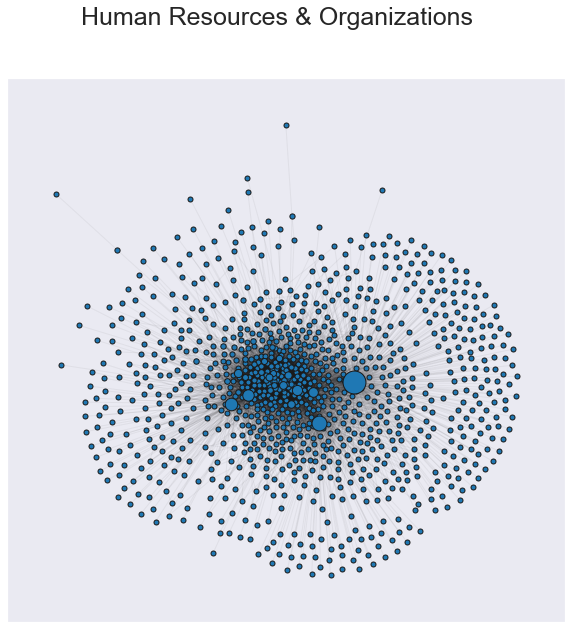

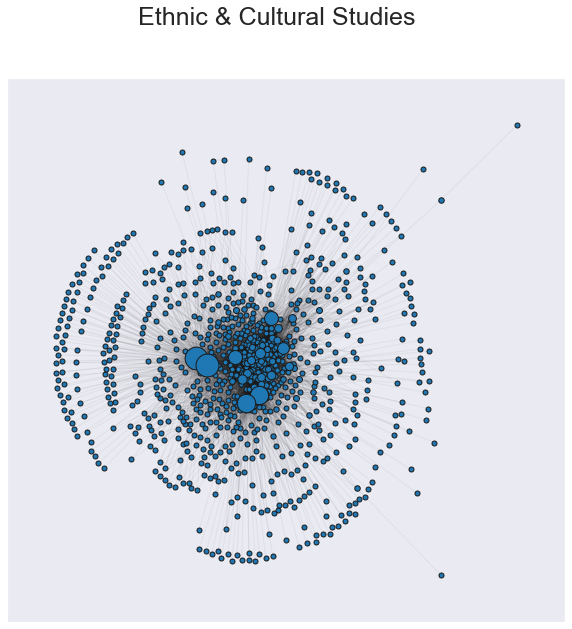

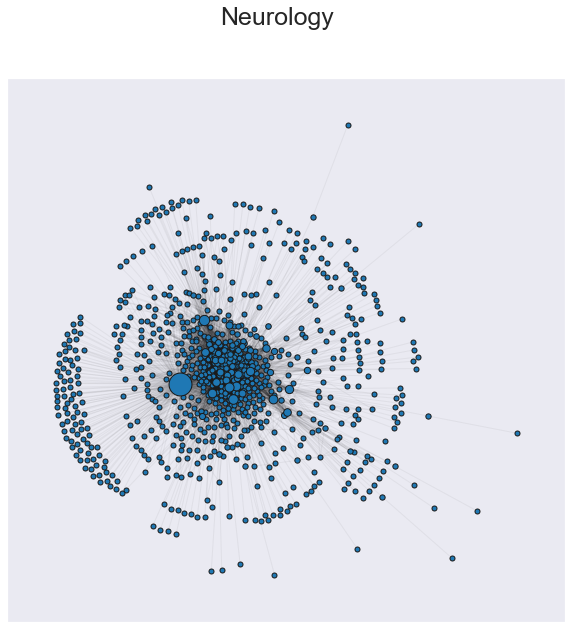

In [12]:
from matplotlib import cm

cmap = cm.plasma
node_factor = 500
# n_cols = 2
# n_rows = np.ceil(len(corpora) / n_cols)

sns.set()

for field_name, G in Gs.items():
    fig, ax = plt.subplots(1, figsize=(10, 10))

    print(field_name, G)

    G = G.to_undirected()
    G = G.subgraph(max(nx.connected_components(G), key=len))
    cent_map = dict(nx.betweenness_centrality(G))

    sorted_cent_map = dict(sorted(cent_map.items(), key=lambda tup: tup[1]))
    node_list = list(sorted_cent_map.keys())
    node_cent = np.fromiter(sorted_cent_map.values(), float)
    normalized_node_map = dict(zip(node_list, node_cent / node_cent.max()))
    normalized_node_list = list(normalized_node_map.keys())
    normalized_node_cent = np.fromiter(normalized_node_map.values(), float)

    pos = nx.nx_agraph.graphviz_layout(G, prog="sfdp") # dot, twopi, fdp, sfdp, circo

    for i, (node, cent) in enumerate(normalized_node_map.items()):
        greater_nodes = nx.draw_networkx_nodes(
            G, 
            pos, 
            nodelist=[node],
            node_size=[cent * node_factor + 25],
            # node_color=[cent],
            node_shape='o',
            alpha=1,
            ax=ax,
            cmap=cmap,
            linewidths=1,
            edgecolors='k',
            margins=None,
        ) 
        greater_nodes.set_zorder(i)

    edges = nx.draw_networkx_edges(
        G, 
        pos,
        width=1.0,
        edge_color='k',
        style='solid',
        alpha=0.05, 
        ax=ax,
        arrows=True,
        nodelist=node_list,
        node_size=node_cent * node_factor,
        node_shape='o',
        connectionstyle='arc3', # , rad=0.3
    )

    # edges.set_zorder(-1)
    for c in edges:
        c.set_zorder(-1)

    ax.grid(False)

    fig.suptitle(field_name, fontsize=25)

    # ax.set_facecolor('transparent')
    # ax.axis('off')
    # fig.set_facecolor('transparent')

    plt.savefig(
        os.path.join(LATEX_FIGURES_PATH, 'co_occurrence_full_graphs', f'{field_name.capitalize()}.png'), 
        transparent=True, 
        dpi=150 
    )

# HeatMap

In [10]:
corpora = co_occurence_graphs(n_edges=50)
Gs = {field_name: corpus['G'] for (field_name, corpus) in corpora.items()}
Dfs = {field_name: corpus['Df'] for (field_name, corpus) in corpora.items()}

Gender Studies Graph with 33 nodes and 50 edges
Geometry Graph with 36 nodes and 50 edges
Geophysics Graph with 36 nodes and 50 edges
Economics Graph with 32 nodes and 50 edges
Language & Linguistics Graph with 34 nodes and 50 edges
Probability & Statistics Graph with 34 nodes and 50 edges
Material Engineering Graph with 32 nodes and 50 edges
Artificial Intelligence Graph with 29 nodes and 50 edges
Sociology Graph with 46 nodes and 50 edges
International Business Graph with 29 nodes and 50 edges
Political Science Graph with 36 nodes and 50 edges
Genetics & Genomics Graph with 38 nodes and 50 edges
Immunology Graph with 50 nodes and 50 edges
Human Resources & Organizations Graph with 40 nodes and 50 edges
Ethnic & Cultural Studies Graph with 36 nodes and 50 edges
Neurology Graph with 29 nodes and 50 edges


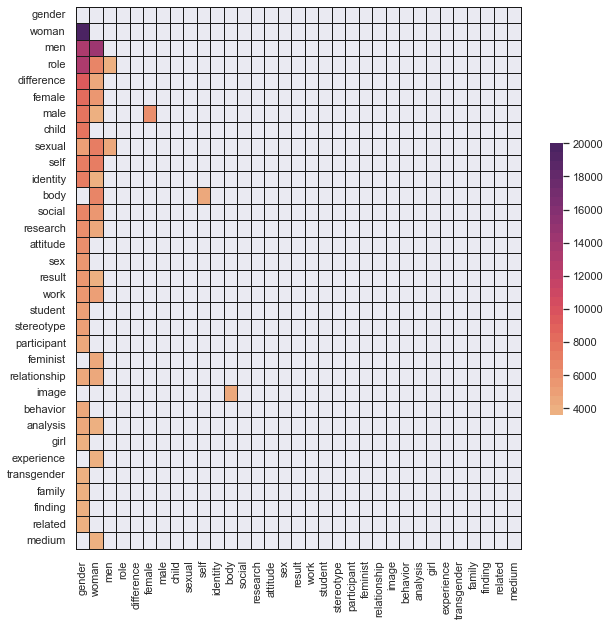

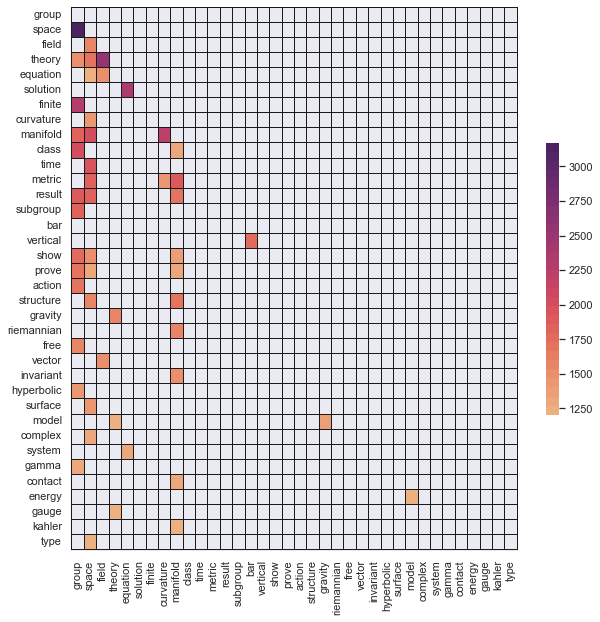

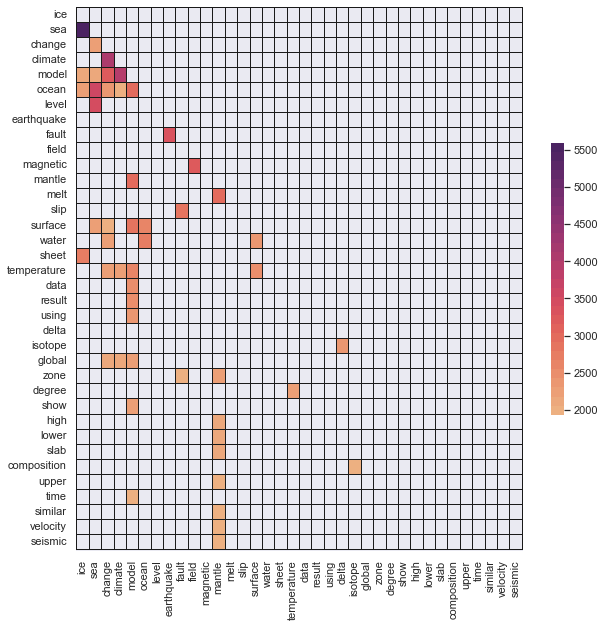

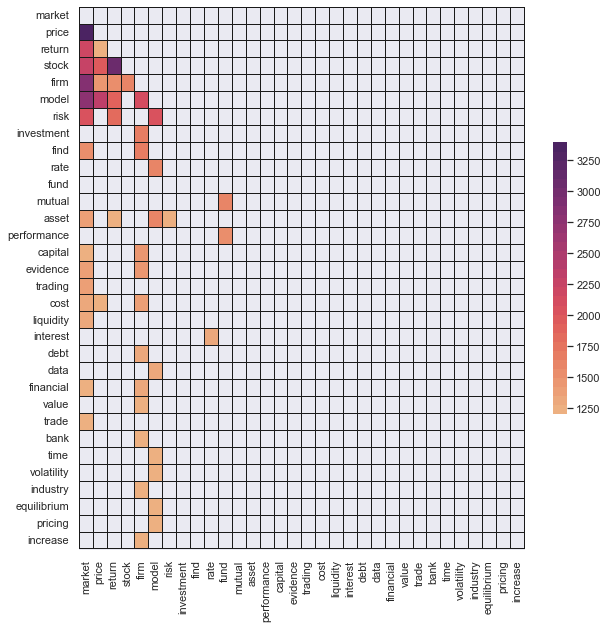

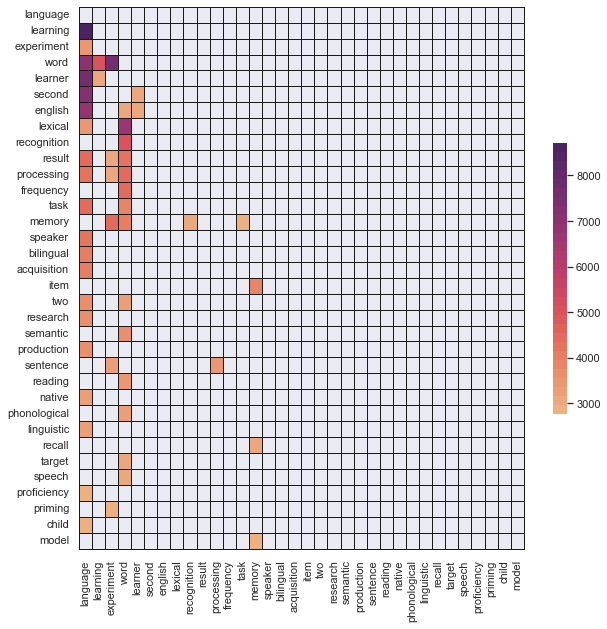

...

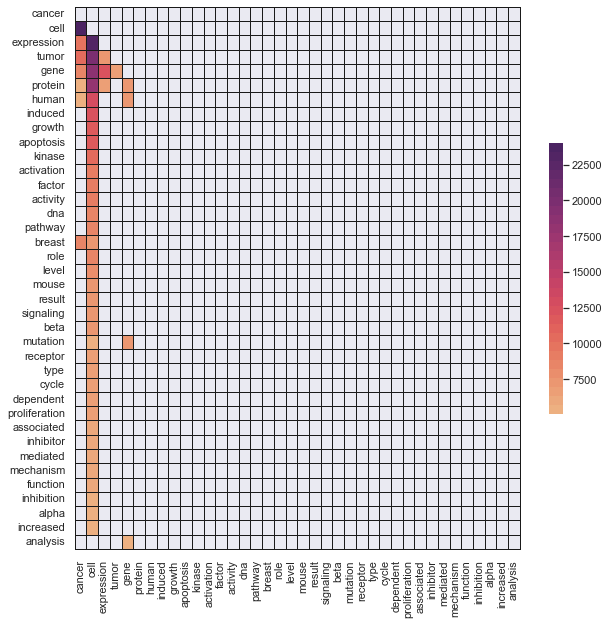

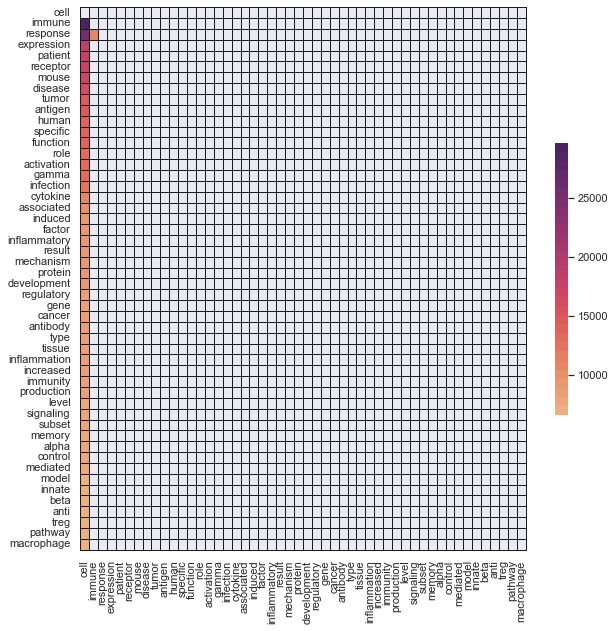

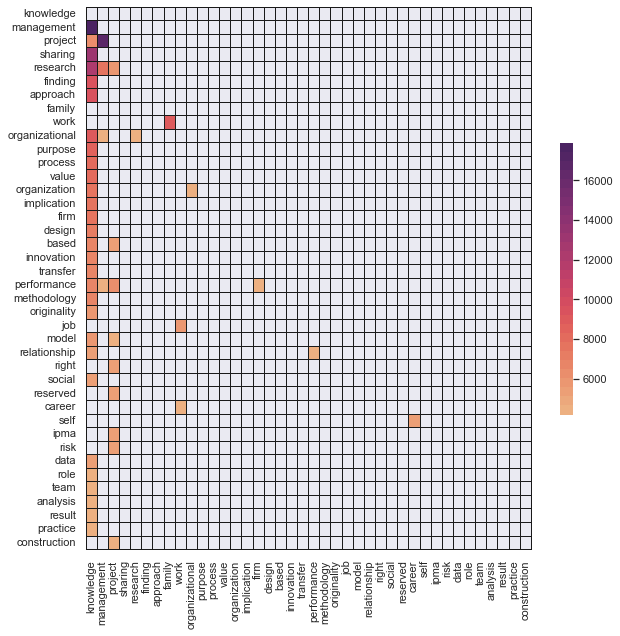

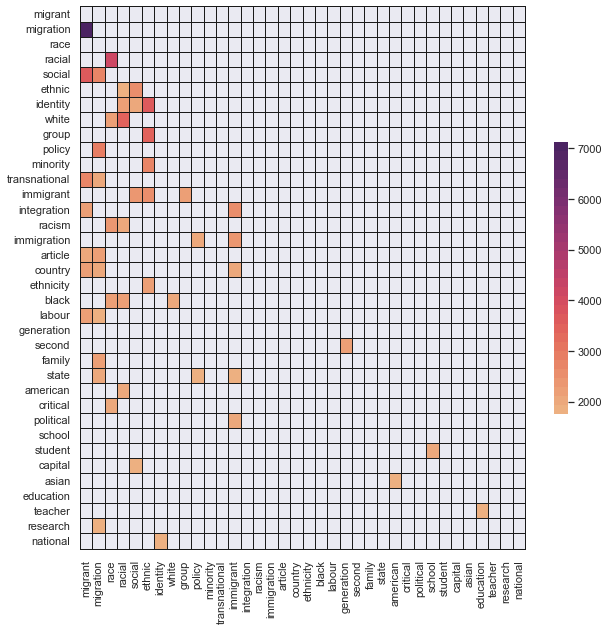

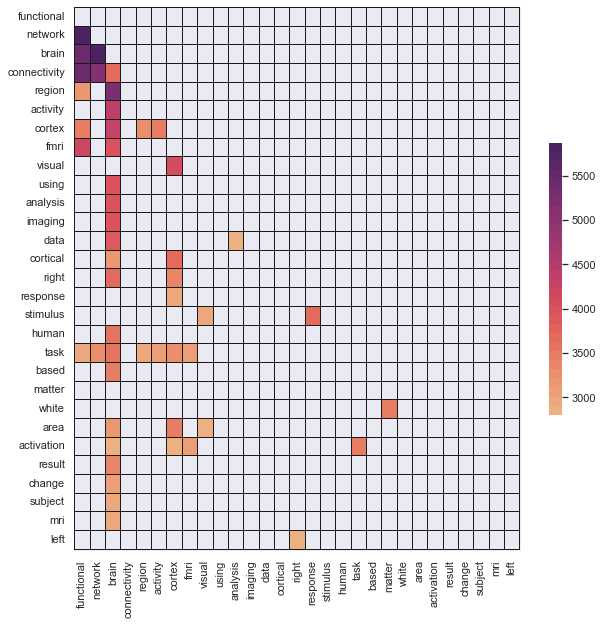

In [11]:
for field_name, G in Gs.items():

    fig, ax = plt.subplots(1, figsize=(10, 10))

    nodes = G.nodes
    am = nx.to_numpy_array(G)
    up_triang = np.triu(np.ones_like(am)).astype(bool)
    cmap = plt.get_cmap('flare',30)
    cmap.set_under('white')
    cmap.set_over('yellow')

    sns.heatmap(am, linewidth=.5, cmap=cmap, linecolor='k', linewidths=0.5, xticklabels=nodes, yticklabels=nodes, mask=(am==0) | (up_triang), ax=ax, cbar_kws={"shrink": 0.5})

    ax.set_xlim(0, len(G) + 0.1)
    ax.set_ylim(len(G) + 0.1, 0)

    plt.savefig(
        os.path.join(LATEX_FIGURES_PATH, 'co_occurrence_heatmap', f'{field_name.capitalize()}.png'), 
        transparent=True, 
        dpi=150 
    )


# Clusters

In [ ]:
# Fragmentation 

In [6]:
communities = {}
for field_name, G in Gs.items():
    communities[field_name] = nx_comm.louvain_communities(G)

In [7]:
{field_name: len(comms) for field_name, comms in communities.items()}

{'Gender Studies': 4,
 'Geometry': 7,
 'Geophysics': 9,
 'Economics': 6,
 'Language & Linguistics': 3,
 'Probability & Statistics': 6,
 'Material Engineering': 7,
 'Artificial Intelligence': 4,
 'Sociology': 11,
 'International Business': 6,
 'Political Science': 4,
 'Genetics & Genomics': 3,
 'Immunology': 3,
 'Human Resources & Organizations': 4,
 'Ethnic & Cultural Studies': 5,
 'Neurology': 7}